In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')


# Figures - Paper

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
#import sys
#sys.path.append("~/Documents/py_scripts/")
#import utils_SL as sl 
#import os
import cmocean as cm
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

#%%
#import seaborn as sns
#from scipy import stats
from matplotlib.gridspec import GridSpec

#%%
#import cartopy.crs as ccrs
from cmocean import cm as cmo
#import cartopy.feature as cfeature
#from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
#import matplotlib as mpl
#from matplotlib import ticker
from matplotlib.collections import LineCollection

#%%

from matplotlib.colors import ListedColormap

# Let's also design our color mapping: 1s should be plotted in blue, 2s in red, etc...
col_dict={1:"black", # WN
          2:"palegoldenrod", # PL
          3:"lightpink", # PLWN
          4:"orange", # AR1
          5:"teal", # Ar5
          6:"darkmagenta", # AR9
          7:"skyblue", # ARf
          8:"crimson" # GGM
          }

# We create a colormar from our list of colors
cmapnm = ListedColormap([col_dict[x] for x in col_dict.keys()])

# Let's also define the description of each category : 1 (blue) is Sea; 2 (red) is burnt, etc... Order should be respected here ! Or using another dict maybe could help.
labels =['WN','PL','PLWN','AR1','AR5','AR9','ARF','GGM']

#%%
import warnings; warnings.simplefilter('ignore')

#%% Define functions:

def rmv_season(tdec,height):
    # Remove seasonlity estimated by OLS
    # given a time vector (tdec) and a variant (height)
    # Returns the deseasonalinzed time series
    acc_idx = np.isfinite(height)
    design_matrix=np.ones([np.sum(acc_idx),6])
    design_matrix[:,1]=tdec[acc_idx]-np.nanmean(tdec) #linear trend
    design_matrix[:,2]=np.cos(2*np.pi*tdec[acc_idx]) # cos-annual
    design_matrix[:,3]=np.sin(2*np.pi*tdec[acc_idx]) # sin-annual
    design_matrix[:,4]=np.cos(2*np.pi*2*tdec[acc_idx]) #cos-semi-annual
    design_matrix[:,5]=np.sin(2*np.pi*2*tdec[acc_idx]) #sin semi-annual
    solution=np.linalg.lstsq(design_matrix,height[acc_idx],rcond=None)[0]
    
    annual=np.matmul(design_matrix[:,(2,3)],solution[2:4])
    semiannual=np.matmul(design_matrix[:,(4,5)],solution[4:6])

    season=np.array(annual+semiannual)
    
    deseason=np.array(height-season)
    
    return deseason


def lat2str(deg):
    # Source: https://github.com/matplotlib/basemap/blob/master/examples/customticks.py
    # Adapted so that 0 has no indication of direction.
    minn = 60 * (deg - np.floor(deg)) # transform to minutes
    deg = np.floor(deg) # degrees
    dirr = 'N'
    if deg < 0:
        if minn != 0.0:
            deg += 1.0
            minn -= 60.0
        dirr = 'S'
    elif deg == 0: dirr = ''
    return ("%d\N{DEGREE SIGN} %s") % (np.abs(deg),dirr)

def lon2str(deg):
    # Source: https://github.com/matplotlib/basemap/blob/master/examples/customticks.py
    # Adapted so that 0 has no indication of direction.
    minn = 60 * (deg - np.floor(deg))
    deg = np.floor(deg)
    dirr = ''#'E'
    if deg < 0:
        if minn != 0.0:
            deg += 1.0
            minn -= 60.0
        dirr = ''#'W'
    elif deg == 0: dirr =''
    return ("%d\N{DEGREE SIGN} %s") % (np.abs(deg),dirr)

def get_dry_msk(data):
    #given a value filed matrix, find the dry mask 
    #an array with 0 for where is land and 1 where is ocean.
    # Get our dry mask
    dry_msk=np.array(data)
    dry_msk[np.isnan(data)==False]=1 #ocean
    dry_msk[np.isnan(data)]=0 #land
    
    return dry_msk
#end of get_dry_msk
    
#*****************************************************************************
#*****************************************************************************
def get_ocean_area(lat,lon,dry_mask,plot=False,info=False):
    # Function that computes the ocean area given a latitude and longitude arrays.
    # Latitude and longitude should be in decimal degrees
    # It requires a dry mask: an array with 0 for where is land and 1 where is ocean.
    # Returns the ocean surface area in kmˆ2 (float number)
    # It also returns an area matrix (km^2), of size(len(lat),len(lon)). 
    # This is the 'weight' of the area in each grid cell. 
    
    R=6371 # Earth's radius in km
    
    #Check the grid resolution:
    deltalat=180/len(lat);
    deltalon=360/len(lon) 
    
    #Transform from degrees to km:

    deltay=(2*np.pi*R*deltalat)/360 #lat to km
    deltax=(2*np.pi*R*np.cos(np.radians(lat))*deltalon)/360 #lon to km
    
    area=np.array([deltax*deltay]*len(lon)).transpose()
    ocean_surf=np.sum(area*dry_mask)
    if info:
        print('The ocean surface is',ocean_surf, 'km^2')
        
        #https://hypertextbook.com/facts/1997/EricCheng.shtml
        ocean_lit=np.array([360000000,361060000,357000000,360008310,357000000])
        print('According to literature the surface should be',np.mean(ocean_lit),'±',round(np.std(ocean_lit)),'kmˆ2')
        
        dif=round((ocean_surf)/np.mean(ocean_lit),2)
        print('Your area is',dif,'of the literature value.')
    
    if plot:
        m=Basemap(projection='cyl',
              llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
              llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
              resolution='c')
    
    #Plot the field using the fast pcolormesh routine and set the colormap to jet.
        m.pcolormesh(lon,lat,dry_mask,shading='flat', 
              cmap='Paired')
        plt.colorbar(label='0=land,1=ocean',orientation='horizontal')
        plt.gca().set(title='Dry mask')
    # end of if loop

    
    return ocean_surf, area
#end of get_ocean_area

#%%
def rmse(pred, obs):

    differences = pred - obs    #the DIFFERENCEs between the predicted and the observed.

    differences_squared = differences ** 2  #the SQUAREs of ^

    mse = differences_squared.mean()  #the MEAN of ^

    rmse_val = np.sqrt(mse) #ROOT of ^

    return rmse_val, mse

def R_sqrd(pred,obs):
    
    SSE = np.sum((obs-pred)**2) # Sum of Squareds of errors(residuals)
    
    SST = np.sum((obs-np.nanmean(obs))**2) # Total Sum of Squares
    
    r = 1 - (float(SSE))/SST
    
    return r

def get_filelist_sufix(path,  #'/Volumes/ccamargo/Data/'
                 sufix='', #'*grb'
                 sort=True
                 ):
    flist=[filename for filename in os.listdir(path) 
    if filename.endswith(sufix)]
    if sort:
        flist=sorted(flist) # Force it to be in the right order
    
    return flist




# Global

## Figure 1

In [2]:
#ds=xr.open_dataset('~/Desktop/paper1/steric/data/final/1993-2017/alldatasets_13_global.nc')
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/time_series_global_1993-2017.nc')
ds

tdec=np.array(ds.tdec)
time=np.array(ds.time)
x=time
fname=np.array(ds.fname)
y=np.array(ds.glbmu) # all around zero

yseas=np.zeros((y.shape))
for i,f in enumerate(fname):
    yseas[i,:]=rmv_season(tdec,y[i,:]) # remove year and half-year signal estimated by OLS

    
# make dataframe
y=yseas*1000 # mm
df=pd.DataFrame(y,columns=time)
df['lb']=list(np.array(ds.fname))
df=df.set_index('lb')
df

lb=np.array(df.index)
lb

df2=df
df=df.drop(['ENS','REA','MiS'])

ind=np.array(np.where(fname=='ENS'))
ens10=y[ind,:]

ind=np.array(np.where(fname=='MiS'))
mis=y[ind,:]

ind=np.array(np.where(fname=='REA'))
rea=y[ind,:]

#%% ensemble mean
ens10.shape
ymu=ens10[0,0,:]
ymu.shape

ystd=np.array([df.std()])
ystd=ystd[0,:]

y68_u=ymu+ystd
y68_l=ymu-ystd
y90_u=ymu+(1.645*ystd)
y90_l=ymu-(1.645*ystd)
y95_u=ymu+(2*ystd)
y95_l=ymu-(2*ystd)

mu10=np.nanmean(ymu)

In [3]:
#ds=xr.open_dataset('~/Desktop/paper1/steric/data/final/2005-2015/alldatasets_19_global.nc')
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/time_series_global_2005-2015.nc')
ds
fname2=np.array(ds.fname)
tdec2=np.array(ds.tdec)
time2=np.array(ds.time)
x2=time2
y=np.array(ds.glbmu) # all around zero
yseas=np.zeros((y.shape))

for i,f in enumerate(fname2):
    yseas[i,:]=rmv_season(tdec2,y[i,:]) # remove year and half-year signal estimated by OLS

    
# make dataframe
y=(yseas*1000)#-mu10#*1000


df3=pd.DataFrame(y,columns=time2)
df3['lb']=list(np.array(ds.fname))
df3=df3.set_index('lb')
df3

lb=np.array(df3.index)
lb

df4=df3
df3=df3.drop(['ENS','REA','MiS','ARGO'])

ind=np.array(np.where(fname2=='ENS'))
ens15=y[ind,:]

ind=np.array(np.where(fname2=='MiS'))
mis15=y[ind,:]

ind=np.array(np.where(fname2=='REA'))
rea15=y[ind,:]

ind=np.array(np.where(fname2=='ARGO'))
argo=y[ind,:]

#%% ensemble mean
ymu=ens15[0,0,:]
ymu.shape

ystd=np.array([df3.std()])
ystd=ystd[0,:]

y68_u2=ymu+ystd
y68_l2=ymu-ystd
y90_u2=ymu+(1.645*ystd)
y90_l2=ymu-(1.645*ystd)
y95_u2=ymu+(2*ystd)
y95_l2=ymu-(2*ystd)

mu15=np.nanmean(ymu)



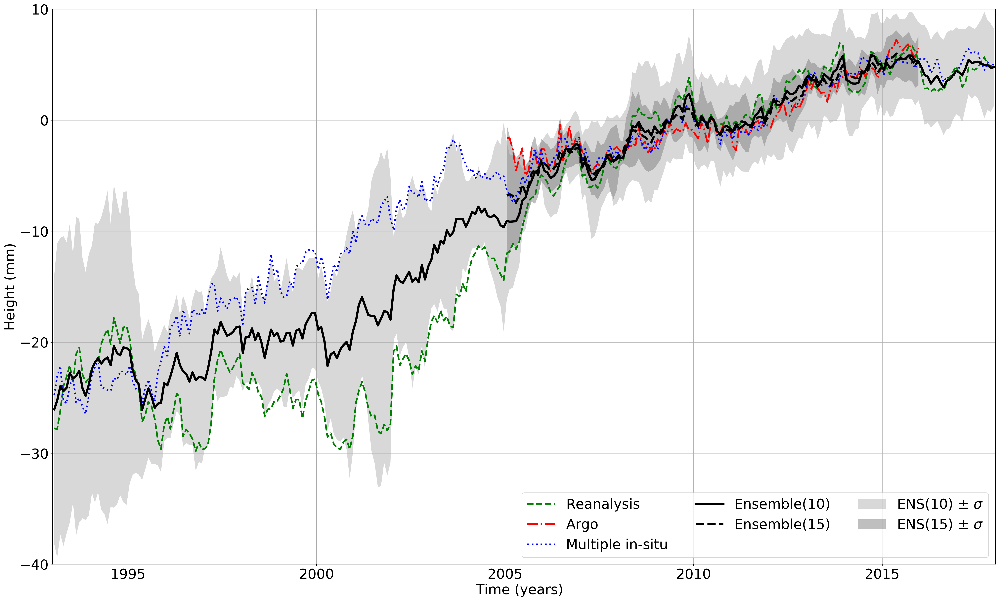

In [4]:
fig, ax = plt.subplots(figsize=(25, 15),dpi=200,constrained_layout=True)

gs = GridSpec(1, 3, figure=fig)

x=tdec # 1993-2017
x2=tdec2 # 2005-2017


# Plot Group means
ax1 = plt.subplot(gs.new_subplotspec((0, 0), colspan=3))

y2=np.array(rea[0,0,:])
offset=np.nanmean(y2[144:276]) # offset w.r.t 2005-2015 time mean
y2=y2-offset
plt.plot(x,y2,label='Reanalysis',color='green',linewidth=3,linestyle='--')


y2=np.array(argo[0,0,:])
offset=np.nanmean(y2)
y2=y2-offset
plt.plot(x2,y2,label='Argo',color='red',linewidth=3,linestyle='-.')

y2=np.array(mis[0,0,:])
offset=np.nanmean(y2[144:276])
y2=y2-offset
plt.plot(x,y2,label='Multiple in-situ',color='blue',linewidth=3,linestyle=':')

y2=np.array(ens10[0,0,:])
offset=np.nanmean(y2[144:276])
y2=y2-offset
plt.plot(x,y2,label='Ensemble(10)',color='black',linewidth=4,linestyle='-')
a=0.3
ax1.fill_between(x,y2,y68_u-offset,facecolor='gray', alpha=a,label='ENS(10) ± $\sigma$')
ax1.fill_between(x,y2,y68_l-offset,facecolor='gray', alpha=a)
a=0.1
#ax1.fill_between(x,y2,y90_u-offset,facecolor='gray', alpha=a,label='ens ± 1.645std')
#ax1.fill_between(x,y2,y90_l-offset,facecolor='gray', alpha=a)

y2=np.array(ens15[0,0,:])
offset=np.nanmean(y2)
y2=y2-offset
plt.plot(x2,y2,label='Ensemble(15)',color='black',linewidth=4,linestyle='--')


a=0.5
ax1.fill_between(x2,y2,y68_u2-offset,facecolor='gray', alpha=a,label='ENS(15) ± $\sigma$')
ax1.fill_between(x2,y2,y68_l2-offset,facecolor='gray', alpha=a)
#a=0.3
#ax1.fill_between(x2,y2,y90_u2+offset+offset2,facecolor='gray', alpha=a,label='ens ± 1.645std')
#ax1.fill_between(x2,y2,y90_l2+offset+offset2,facecolor='gray', alpha=a)

plt.legend(loc='lower right',ncol=3,fontsize=25)
plt.ylabel('Height (mm)',fontsize=25)
plt.xlabel('Time (years)  ',fontsize=25)
#plt.ylim([-12,12])
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)

plt.xlim([1993,2018])
plt.ylim([-40,10])
plt.grid(True)
plt.show()

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/1_global_timeseries_noclim_grid.pdf',
            format='pdf',dpi=200,bbox_inches='tight')
fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/1_global_timeseries_noclim_grid.png',
            format='png',dpi=200,bbox_inches='tight')

Figure 1. Global mean steric time series of the ensemble (black solid and dashed line) and group means (green for reanalysis, red for only Argo, and blue for multiple in-situ) normalized w.r.t the time-mean from 2005-2015. Annual and semi-annual signals have been removed from the time-series. Shaded grey areas represent the ensemble ± 1 standard deviation (light and dark grey for the ensemble of ten and fifteen datasets, respectively).The solid black line is the ensemble of ten datasets from 1993-2017, and the dashed black line is the ensemble from 2005-2015 of the fifteen datasets.

## Figure 2

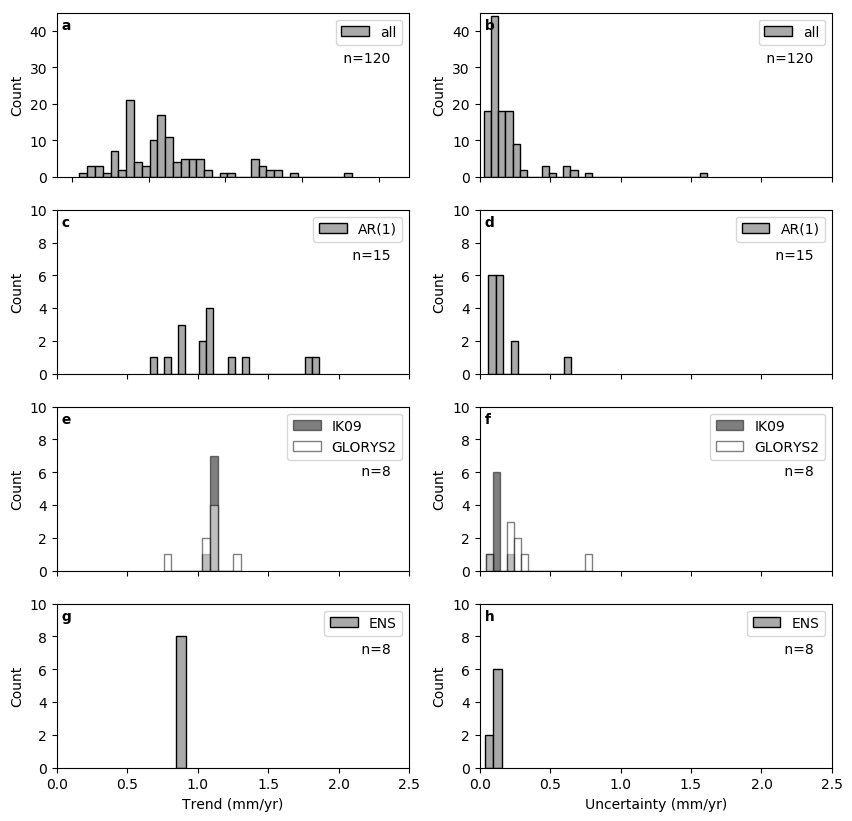

In [5]:
#ds=xr.open_dataset('~/Desktop/paper1/steric/data/trends/2005-2015/alldatasets_19_trends_global.nc')
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_2005-2015.nc')

ds
nm=np.array(ds.nm)
name=np.array(ds.fname)

aic=np.array(ds.aic)
bic=np.array(ds.bic)
tr=np.array(ds.trend)
tr_err=np.array(ds.unc)

##################
bw=0.05 # bin width
bn = 25 # bin number
xmin=0;xmax=2.5
ymin=0;ymax=45

fig=plt.figure(figsize=(10,10),dpi=100)
ax=plt.subplot(4,2,1)
x=np.hstack(tr[:,0:15])
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['all'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )

plt.ylabel('Count')
plt.xlim(0.4, 2.7)
plt.ylim(ymin,ymax)
ax.text(.0,.9,' a ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=120 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)
ax.xaxis.set_ticklabels([])

##########
ax=plt.subplot(4,2,2)
x=np.hstack(tr_err[:,0:15])
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['all'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )

plt.ylabel('Count')

ax.text(.0,.9,' b ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=120 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
ax.xaxis.set_ticklabels([])

#########
ymax=10
ax=plt.subplot(4,2,3)
plt.ylabel('Count')
i=np.array(np.where(nm=='AR1'))
x=tr[i[0,0],0:15] # AR1
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['AR(1)'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )

plt.ylabel('Count')
ax.text(.0,.9,' c ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=15 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
ax.xaxis.set_ticklabels([])


###################
ax=plt.subplot(4,2,4)
x=tr_err[i[0,0],0:15] # AR1
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['AR(1)'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )

plt.ylabel('Count')

ax.text(.0,.9,' d ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=15 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
ax.xaxis.set_ticklabels([])


#########################
ax=plt.subplot(4,2,5)

x=tr[:,12]
df=pd.DataFrame(x,columns=['IK09'])
x=tr[:,9]
df['GLORYS2']=x
rg=np.nanmax(df)-np.nanmin(df)

df.plot.hist(ax=ax, bins=int(rg/bw),
#             legend=False,
             edgecolor='black',color=('black','white'),alpha=0.5
             )

#bars = ax.patches
#hatches = ''.join(h*len(df) for h in ' ...')

#for bar, hatch in zip(bars, hatches):
#    bar.set_hatch(hatch)

#ax.legend(loc='center right', 
#          bbox_to_anchor=(1, 0.9), 
#          ncol=1)
ax.text(.0,.9,' e ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.58,' n=8 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.ylabel('Count')


plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
ax.xaxis.set_ticklabels([])

###################
ax=plt.subplot(4,2,6)

x=tr_err[:,12]
df=pd.DataFrame(x,columns=['IK09'])
x=tr_err[:,9]
df['GLORYS2']=x
rg=np.nanmax(df)-np.nanmin(df)

df.plot.hist(ax=ax, bins=int(rg/bw),
#             legend=False,
             edgecolor='black',color=('black','white'),alpha=0.5
             )

#bars = ax.patches
#hatches = ''.join(h*len(df) for h in ' ...')

#for bar, hatch in zip(bars, hatches):
#    bar.set_hatch(hatch)

#ax.legend(loc='center right', 
#          bbox_to_anchor=(1, 0.9), 
#          ncol=1)
plt.legend(loc='top right')
ax.text(.0,.9,' f ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.58,' n=8 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.ylabel('Count')


plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
ax.xaxis.set_ticklabels([])

#####################
ax=plt.subplot(4,2,7)

plt.ylabel('Count')
x=tr[:,15] # ENS
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['ENS'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )

ax.text(.0,.9,' g ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=8 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)
plt.xlabel('Trend (mm/yr)')
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.ylabel('Count')
##################
ax=plt.subplot(4,2,8)

x=tr_err[:,15] # ENS
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['ENS'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey'
            )
ax.text(.0,.9,' h ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=8 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.xlabel('Uncertainty (mm/yr)')
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.ylabel('Count')
plt.show()

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/2_histogram_2005.pdf',
            format='pdf',dpi=200,bbox_inches='tight')
fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/2_histogram_2005.png',
            format='png',dpi=200,bbox_inches='tight')


Figure 2.Histogram of the trend (left column) and uncertainty (right column) varying all noise-models and all datasets (a,b), for noise-model AR1 varying all the datasets (c,d), for the ensemble mean varying noise-models (e,f) and for the Glorys dataset varying the noise-models (g,h). All x axis are in mm/y, and the y axis is the histogram count.

## Figure 3

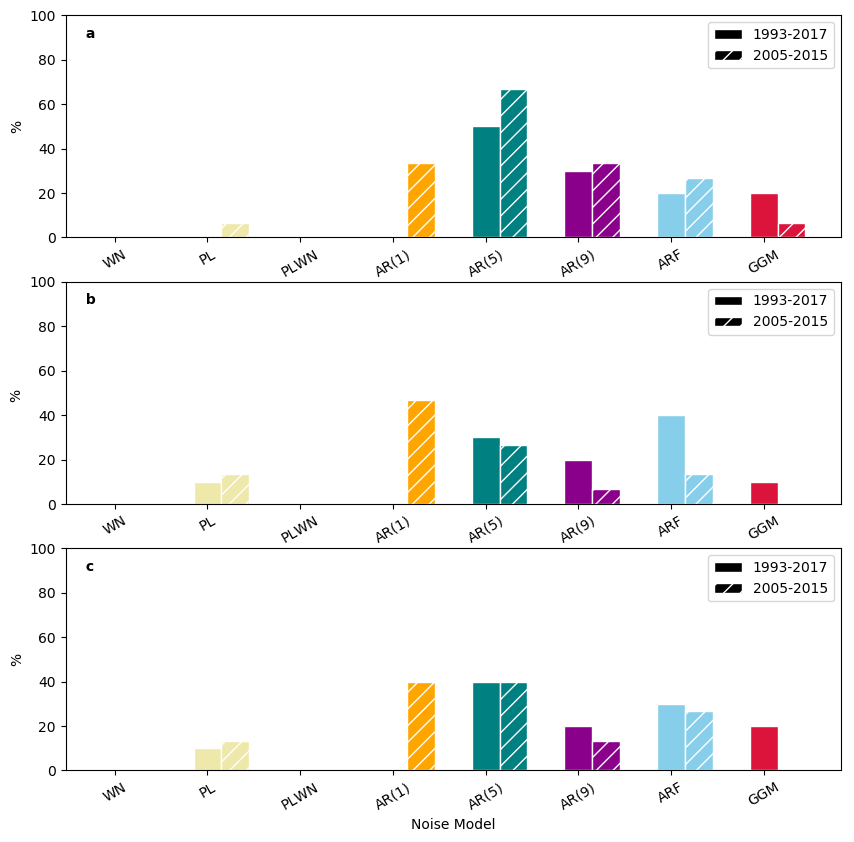

In [7]:
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_1993-2017.nc')
nm=np.array(ds.nm)
j=10 # do not include ensemble and group means
name=np.array(ds.fnames[0:j])
aic=np.array(ds.aic[:,0:j])
bic=np.array(ds.bic[:,0:j])
aicbic=np.mean([aic,bic],axis=0)
tr=np.array(ds.trend[:,0:j])
tr_err=np.array(ds.unc[:,0:j])

bic2=np.zeros((bic.shape))
aic2=np.zeros((aic.shape))
aicbic2=np.zeros((aic.shape))
for j in np.arange(0,len(name)):
    
    tg=aic[:,j]
    logaic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logaic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logaic 
    logaic[np.isnan(logaic)]=0
    indaic=np.where(logaic>0.5)
    indaic=np.array(indaic)
    for i in np.arange(0,8):
        for ind in indaic:
            for ind2 in ind:
                if i==ind2:        
                    aic2[i,j]=1
    
    tg=bic[:,j]
    logbic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logbic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logbic 
    logbic[np.isnan(logbic)]=0
    indbic=np.where(logbic>0.5)
    indbic=np.array(indbic)
    for i in np.arange(0,8):
        for ind in indbic:
            for ind2 in ind:
                if i==ind2:        
                    bic2[i,j]=1

    #AIC|BIC
    tg=aicbic[:,j]
    logab=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logab[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logab
    logab[np.isnan(logab)]=0
    indab=np.where(logab>0.5)
    indab=np.array(indab)
    for i in np.arange(0,8):
        for ind in indab:
            for ind2 in ind:
                if i==ind2:        
                    aicbic2[i,j]=1
                    

rkb=np.sum(bic2,axis=1)

rka=np.sum(aic2,axis=1)

rk=np.sum(aicbic2,axis=1)

df=pd.DataFrame(rkb,columns=['bic93'])
df['aic93']=rka
df['avg93']=rk
df['cor']=['black','palegoldenrod','lightpink',
          'orange','teal','darkmagenta','skyblue','crimson']
df['nm']=nm
#%%
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_2005-2015.nc')
ds
j=15
nm2=np.array(ds.nm)
name=np.array(ds.fnames[0:j])
aic=np.array(ds.aic[:,0:j])
bic=np.array(ds.bic[:,0:j])
aicbic=np.mean([aic,bic],axis=0)
tr=np.array(ds.trend[:,0:j])
tr_err=np.array(ds.unc[:,0:j])

bic2=np.zeros((bic.shape))
aic2=np.zeros((aic.shape))
aicbic2=np.zeros((aic.shape))
for j in np.arange(0,len(name)):
    
    tg=aic[:,j]
    logaic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logaic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logaic 
    logaic[np.isnan(logaic)]=0
    indaic=np.where(logaic>0.5)
    indaic=np.array(indaic)
    for i in np.arange(0,8):
        for ind in indaic:
            for ind2 in ind:
                if i==ind2:        
                    aic2[i,j]=1
    
    tg=bic[:,j]
    logbic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logbic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logbic 
    logbic[np.isnan(logbic)]=0
    indbic=np.where(logbic>0.5)
    indbic=np.array(indbic)
    for i in np.arange(0,8):
        for ind in indbic:
            for ind2 in ind:
                if i==ind2:        
                    bic2[i,j]=1

    #AIC|BIC
    tg=aicbic[:,j]
    logab=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logab[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logab
    logab[np.isnan(logab)]=0
    indab=np.where(logab>0.5)
    indab=np.array(indab)
    for i in np.arange(0,8):
        for ind in indab:
            for ind2 in ind:
                if i==ind2:        
                    aicbic2[i,j]=1
                    

rkb=np.sum(bic2,axis=1)

rka=np.sum(aic2,axis=1)

rk=np.sum(aicbic2,axis=1)


df['bic05']=rkb
df['aic05']=rka
df['avg05']=rk

#%%
dfr=df
# no means
j=10
dfr['bic93']=df['bic93']/j*100
dfr['aic93']=df['aic93']/j*100
dfr['avg93']=df['avg93']/j*100
j=15
dfr['bic05']=df['bic05']/j*100
dfr['aic05']=df['aic05']/j*100
dfr['avg05']=df['avg05']/j*100

#change from ['WN', 'PL', 'PLWN', 'AR1', 'AR5', 'AR9', 'ARF', 'GGMWN'] to:
df['nm2']=['WN','PL','PLWN','AR(1)','AR(5)','AR(9)','ARF','GGM'] 
nm2=np.array(df['nm2'])

#%%
#####################################
#####################################
# Plot
fig=plt.figure(figsize=(10,10),dpi=100)

# AIC
ax=plt.subplot(3,1,1)
bars1=np.array(df['aic93'])
bars2=np.array(df['aic05'])
# set width of bar
barWidth = 0.3
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
plt.bar(r1, bars1, color=df['cor'], width=barWidth, edgecolor='white',
        label='1993-2017')
plt.bar(r2, bars2, color=df['cor'], width=barWidth, edgecolor='white',
        label='2005-2015',hatch='//')
plt.legend(loc='upper right')

plt.xticks(r1,nm2,fontsize=10,rotation=30)
plt.ylabel('%', fontsize=10)
plt.ylim(0,100)
#plt.xlabel('Noise Model')
#plt.title('Preferred Noise Model')
ax.text(.02,.90,' a ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)

#BIC
ax=plt.subplot(3,1,2)
bars1=np.array(df['bic93'])
bars2=np.array(df['bic05'])
# set width of bar
barWidth = 0.3
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
plt.bar(r1, bars1, color=df['cor'], width=barWidth, edgecolor='white',
        label='1993-2017')
plt.bar(r2, bars2, color=df['cor'], width=barWidth, edgecolor='white',
        label='2005-2015',hatch='//')
plt.legend(loc='upper right')
plt.xticks(r1,nm2,fontsize=10,rotation=30)
plt.ylabel('% ', fontsize=10)
plt.ylim(0,100)
ax.text(.02,.90,' b ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)

#plt.xlabel('Noise Model')
#plt.title('BIC Ranking')

#AVG
ax=plt.subplot(3,1,3)
bars1=np.array(df['avg93'])
bars2=np.array(df['avg05'])
# set width of bar
barWidth = 0.3
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
plt.bar(r1, bars1, color=df['cor'], width=barWidth, edgecolor='white',
        label='1993-2017')
plt.bar(r2, bars2, color=df['cor'], width=barWidth, edgecolor='white',
        label='2005-2015',hatch='//')
plt.legend(loc='upper right')
plt.xticks(r1,nm2,fontsize=10,rotation=30)
plt.ylabel('%', fontsize=10)
plt.xlabel('Noise Model')
#plt.title('AIC/BIC Ranking')
plt.ylim(0,100)
ax.text(.02,.90,' c ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)

plt.show()

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/3_NMscores-global_nomeans.png',
            format='png',dpi=100,bbox_inches='tight')
fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/3_NMscores-global_nomeans.pdf',
            format='pdf',dpi=100,bbox_inches='tight')


Figure 3. Scoring based only on the 10 datasets from 1993-2017 and 15 datasets from 2005-2015. The ensemble and group means are NOT included. 

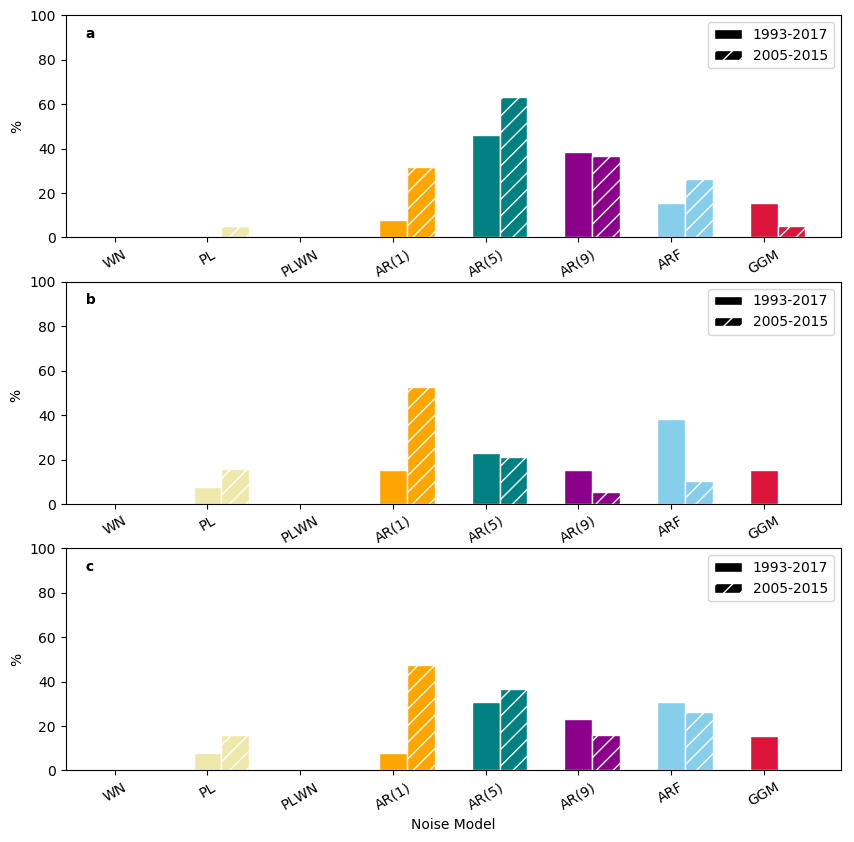

In [8]:
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_1993-2017.nc')
nm=np.array(ds.nm)
j=13 # include ensemble and group means
name=np.array(ds.fnames[0:j])
aic=np.array(ds.aic[:,0:j])
bic=np.array(ds.bic[:,0:j])
aicbic=np.mean([aic,bic],axis=0)
tr=np.array(ds.trend[:,0:j])
tr_err=np.array(ds.unc[:,0:j])

bic2=np.zeros((bic.shape))
aic2=np.zeros((aic.shape))
aicbic2=np.zeros((aic.shape))
for j in np.arange(0,len(name)):
    
    tg=aic[:,j]
    logaic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logaic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logaic 
    logaic[np.isnan(logaic)]=0
    indaic=np.where(logaic>0.5)
    indaic=np.array(indaic)
    for i in np.arange(0,8):
        for ind in indaic:
            for ind2 in ind:
                if i==ind2:        
                    aic2[i,j]=1
    
    tg=bic[:,j]
    logbic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logbic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logbic 
    logbic[np.isnan(logbic)]=0
    indbic=np.where(logbic>0.5)
    indbic=np.array(indbic)
    for i in np.arange(0,8):
        for ind in indbic:
            for ind2 in ind:
                if i==ind2:        
                    bic2[i,j]=1

    #AIC|BIC
    tg=aicbic[:,j]
    logab=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logab[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logab
    logab[np.isnan(logab)]=0
    indab=np.where(logab>0.5)
    indab=np.array(indab)
    for i in np.arange(0,8):
        for ind in indab:
            for ind2 in ind:
                if i==ind2:        
                    aicbic2[i,j]=1
                    

rkb=np.sum(bic2,axis=1)

rka=np.sum(aic2,axis=1)

rk=np.sum(aicbic2,axis=1)

df=pd.DataFrame(rkb,columns=['bic93'])
df['aic93']=rka
df['avg93']=rk
df['cor']=['black','palegoldenrod','lightpink',
          'orange','teal','darkmagenta','skyblue','crimson']
df['nm']=nm
#%%
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_2005-2015.nc')
ds
j=19
nm2=np.array(ds.nm)
name=np.array(ds.fnames[0:j])
aic=np.array(ds.aic[:,0:j])
bic=np.array(ds.bic[:,0:j])
aicbic=np.mean([aic,bic],axis=0)
tr=np.array(ds.trend[:,0:j])
tr_err=np.array(ds.unc[:,0:j])

bic2=np.zeros((bic.shape))
aic2=np.zeros((aic.shape))
aicbic2=np.zeros((aic.shape))
for j in np.arange(0,len(name)):
    
    tg=aic[:,j]
    logaic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logaic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logaic 
    logaic[np.isnan(logaic)]=0
    indaic=np.where(logaic>0.5)
    indaic=np.array(indaic)
    for i in np.arange(0,8):
        for ind in indaic:
            for ind2 in ind:
                if i==ind2:        
                    aic2[i,j]=1
    
    tg=bic[:,j]
    logbic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logbic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logbic 
    logbic[np.isnan(logbic)]=0
    indbic=np.where(logbic>0.5)
    indbic=np.array(indbic)
    for i in np.arange(0,8):
        for ind in indbic:
            for ind2 in ind:
                if i==ind2:        
                    bic2[i,j]=1

    #AIC|BIC
    tg=aicbic[:,j]
    logab=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logab[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logab
    logab[np.isnan(logab)]=0
    indab=np.where(logab>0.5)
    indab=np.array(indab)
    for i in np.arange(0,8):
        for ind in indab:
            for ind2 in ind:
                if i==ind2:        
                    aicbic2[i,j]=1
                    

rkb=np.sum(bic2,axis=1)

rka=np.sum(aic2,axis=1)

rk=np.sum(aicbic2,axis=1)


df['bic05']=rkb
df['aic05']=rka
df['avg05']=rk

#%%
dfr=df
# with means
j=13
dfr['bic93']=df['bic93']/j*100
dfr['aic93']=df['aic93']/j*100
dfr['avg93']=df['avg93']/j*100
j=19
dfr['bic05']=df['bic05']/j*100
dfr['aic05']=df['aic05']/j*100
dfr['avg05']=df['avg05']/j*100

df['nm2']=['WN','PL','PLWN','AR(1)','AR(5)','AR(9)','ARF','GGM']
nm2=np.array(df['nm2'])

#%%
#####################################
#####################################
fig=plt.figure(figsize=(10,10),dpi=100)

# AIC
ax=plt.subplot(3,1,1)
bars1=np.array(df['aic93'])
bars2=np.array(df['aic05'])
# set width of bar
barWidth = 0.3
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
plt.bar(r1, bars1, color=df['cor'], width=barWidth, edgecolor='white',
        label='1993-2017')
plt.bar(r2, bars2, color=df['cor'], width=barWidth, edgecolor='white',
        label='2005-2015',hatch='//')
plt.legend(loc='upper right')

plt.xticks(r1,nm2,fontsize=10,rotation=30)
plt.ylabel('%', fontsize=10)
plt.ylim(0,100)
#plt.xlabel('Noise Model')
#plt.title('Preferred Noise Model')
ax.text(.02,.90,' a ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)

#BIC
ax=plt.subplot(3,1,2)
bars1=np.array(df['bic93'])
bars2=np.array(df['bic05'])
# set width of bar
barWidth = 0.3
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
plt.bar(r1, bars1, color=df['cor'], width=barWidth, edgecolor='white',
        label='1993-2017')
plt.bar(r2, bars2, color=df['cor'], width=barWidth, edgecolor='white',
        label='2005-2015',hatch='//')
plt.legend(loc='upper right')
plt.xticks(r1,nm2,fontsize=10,rotation=30)
plt.ylabel('% ', fontsize=10)
plt.ylim(0,100)
ax.text(.02,.90,' b ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)

#plt.xlabel('Noise Model')
#plt.title('BIC Ranking')

#AVG
ax=plt.subplot(3,1,3)
bars1=np.array(df['avg93'])
bars2=np.array(df['avg05'])
# set width of bar
barWidth = 0.3
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
plt.bar(r1, bars1, color=df['cor'], width=barWidth, edgecolor='white',
        label='1993-2017')
plt.bar(r2, bars2, color=df['cor'], width=barWidth, edgecolor='white',
        label='2005-2015',hatch='//')
plt.legend(loc='upper right')
plt.xticks(r1,nm2,fontsize=10,rotation=30)
plt.ylabel('%', fontsize=10)
plt.xlabel('Noise Model')
#plt.title('AIC/BIC Ranking')
plt.ylim(0,100)
ax.text(.02,.90,' c ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)

plt.show()

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/3_NMscores-global_withmeans.png',
            format='png',dpi=100,bbox_inches='tight')
fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/3_NMscores-global_withmeans.pdf',
            format='pdf',dpi=100,bbox_inches='tight')


Figure 3. Noise model selection based on all datasets (10+3 from 1993-2017; 15+4 from 2005-2015) 

Updated Figure 3. Relative proportion on the y-axis! in percertage - Based on all datasets (10+3 and 15+4)


## Figure 4

In [9]:

# Scatter plot with AR(1)

# 2005-2015
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_2005-2015.nc')
ds
name=np.array(ds.fnames)
nm=np.array(ds.nm)
tr=np.array(ds.trend)
tr_err=np.array(ds.unc)

i=3
nm[i] # AR1
j=15
name[0:j]
######################
df=pd.DataFrame(tr[i,0:j].transpose(),columns=['AR1_tr_2005'])
df.head()
df['name']=name[0:j]
df['AR1_unc_2005']=tr_err[i,0:j].transpose()


typ=[None]*len(name[0:j])
cor=[None]*len(typ)
for k,n in enumerate(name):
    if any([n=='APDRC',n=='SIORG',n=='BOA',n=='ISAS']):
        typ[k]='Argo'
        cor[k]='red'
    if any([n=='Armor3D',n=='CORA',n=='C17',n=='EN4',n=='ISAS+',n=='IK09']):
        typ[k]='MiS'
        cor[k]='blue'
    if any([n=='CGlors',n=='FOAM',n=='ORAS',n=='GLORYS',n=='SODA']):
        typ[k]='REA'
        cor[k]='green'
    

df['typ']=typ
df['cor']=cor

df
df.name[9]='GLORYS2'
df.name[4]='C-GLORS'


df=df.set_index('name')
######################
dfmu=pd.DataFrame(tr[i,j:len(name)].transpose(),columns=['trend'])
dfmu
dfmu['Name']=name[j:len(name)]
dfmu['unc']=tr_err[i,j:len(name)].transpose()
dfmu_ar1_2005=dfmu


#%%
# 1993-2017
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_1993-2017.nc')
ds
name2=np.array(ds.fnames)


name2[1]='C-GLORS'
name2[6]='GLORYS2'


nm=np.array(ds.nm)
tr=np.array(ds.trend)
tr_err=np.array(ds.unc)

i=3
nm[i] # AR1
j=10
name[0:j]
######################
df2=pd.DataFrame(tr[i,0:j].transpose(),columns=['AR1_tr_1993'])
df2.head()
df2['name']=name2[0:j]
df2['AR1_unc_1993']=tr_err[i,0:j].transpose()


typ=[None]*len(name2[0:j])
cor=[None]*len(typ)
for k,n in enumerate(name2):
    if any([n=='APDRC',n=='SIORG',n=='BOA',n=='ISAS']):
        typ[k]='Argo'
        cor[k]='red'
    if any([n=='Armor3D',n=='CORA',n=='C17',n=='EN4',n=='ISAS+',n=='IK09']):
        typ[k]='MiS'
        cor[k]='blue'
    if any([n=='C-GLORS',n=='FOAM',n=='ORAS',n=='GLORYS2',n=='SODA']):
        typ[k]='REA'
        cor[k]='green'
    

df2['typ']=typ
df2['cor']=cor
df2=df2.set_index('name')
df['AR1_tr_1993']=df2['AR1_tr_1993']
df['AR1_unc_1993']=df2['AR1_unc_1993']
df=df.fillna(0)
df=df.sort_values('typ')
######################
dfmu2=pd.DataFrame(tr[i,j:len(name2)].transpose(),columns=['trend'])
dfmu2
dfmu2['Name']=name2[j:len(name2)]
dfmu2['unc']=tr_err[i,j:len(name2)].transpose()
dfmu_ar1_1993=dfmu2



print('We find a steric sea-level trend from 1993-2017 of '+str(dfmu_ar1_1993.trend[2])+'±'+str(dfmu_ar1_1993.unc[2])+'mm/yr')
print('We find a steric sea-level trend from 2005-2015 of '+str(dfmu_ar1_2005.trend[3])+'±'+str(dfmu_ar1_2005.unc[3])+'mm/yr')



We find a steric sea-level trend from 1993-2017 of 1.362±0.102mm/yr
We find a steric sea-level trend from 2005-2015 of 1.078±0.073mm/yr


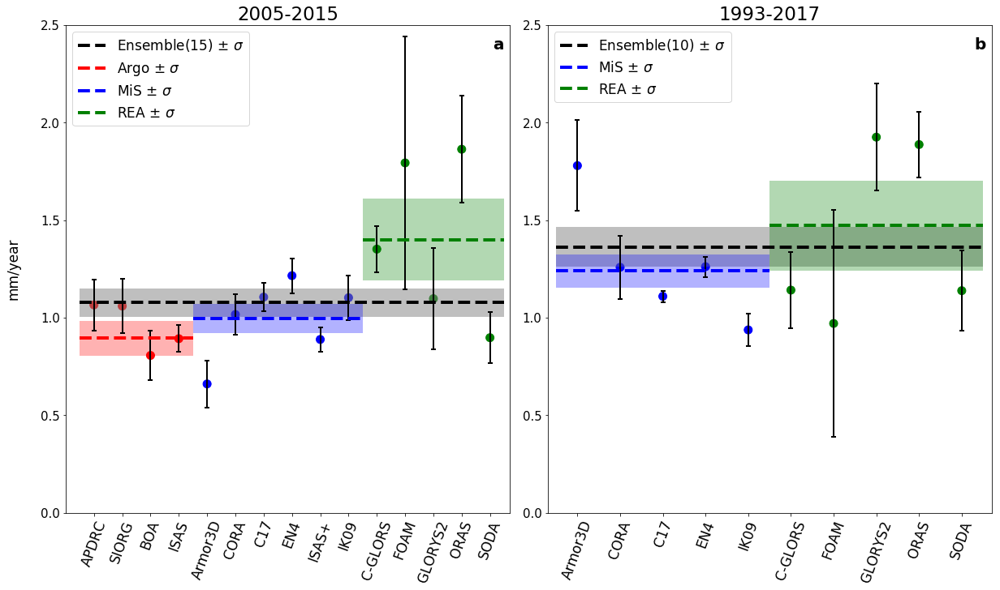

In [10]:
bars1=np.array(df['AR1_tr_2005'])
yerr1=np.array(df['AR1_unc_2005'])


# Set position of bar on X axis
r1 = np.arange(len(bars1))


fig, ax = plt.subplots(figsize=(17, 10),constrained_layout=True)

gs = GridSpec(1, 4, figure=fig)

# 2005-2015
ax1 = plt.subplot(gs.new_subplotspec((0, 0), colspan=2))
plt.scatter(r1+0.5,bars1,#marker=syb,
            s=100,
            color=df['cor'])

plt.errorbar(r1+0.5,bars1,yerr=df['AR1_unc_2005'],color=df['cor'],
             capsize=3,capthick=2,ecolor='black',lw=2,fmt='none')


y=dfmu_ar1_2005.trend[3]
x= np.arange(len(bars1)+1)
y=np.repeat(y,len(x))
yu=y+dfmu_ar1_2005.unc[3]
yl=y-dfmu_ar1_2005.unc[3]
plt.plot(x,y,label='Ensemble(15) ± $\sigma$',color='black',linewidth=4,linestyle='--')
a=0.5
ax1.fill_between(x,y,yu,facecolor='gray', alpha=a)#,label=' ± $\sigma$')
ax1.fill_between(x,y,yl,facecolor='gray', alpha=a)

y=dfmu_ar1_2005.trend[0]
xx=np.arange(x[0],5)
y=np.repeat(y,len(xx))
yu=y+dfmu_ar1_2005.unc[0]
yl=y-dfmu_ar1_2005.unc[0]
plt.plot(xx,y,label='Argo ± $\sigma$',color='red',linewidth=4,linestyle='--')
a=0.3
ax1.fill_between(xx,y,yu,facecolor='red', alpha=a)#,label=' ± $\sigma$')
ax1.fill_between(xx,y,yl,facecolor='red', alpha=a)

y=dfmu_ar1_2005.trend[1]
xx=np.arange(4,11)
y=np.repeat(y,len(xx))
yu=y+dfmu_ar1_2005.unc[1]
yl=y-dfmu_ar1_2005.unc[1]
plt.plot(xx,y,label='MiS ± $\sigma$',color='blue',linewidth=4,linestyle='--')
a=0.3
ax1.fill_between(xx,y,yu,facecolor='blue', alpha=a)#,label=' ± $\sigma$')
ax1.fill_between(xx,y,yl,facecolor='blue', alpha=a)

y=dfmu_ar1_2005.trend[2]
xx=np.arange(10,x[-1]+1)
y=np.repeat(y,len(xx))
yu=y+dfmu_ar1_2005.unc[2]
yl=y-dfmu_ar1_2005.unc[2]
plt.plot(xx,y,label='REA ± $\sigma$',color='green',linewidth=4,linestyle='--')
a=0.3
ax1.fill_between(xx,y,yu,facecolor='green', alpha=a)#,label=' ± $\sigma$')
ax1.fill_between(xx,y,yl,facecolor='green', alpha=a)

plt.xticks([r+0.5  for r in range(len(bars1))], df.index,rotation=70,fontsize=17)
plt.title('2005-2015',fontsize=23)
plt.xlim([-0.5,15.2])
plt.legend(loc='upper left',ncol=1,fontsize=17)

plt.yticks(fontsize=15)
plt.ylabel('mm/year\n',fontsize=17)
plt.ylim([0,2.5])
ax1.text(0.95,0.95,' a ',weight='bold',fontsize=20,
        horizontalalignment='left',
        transform=ax1.transAxes)

####
# 1993-2017
ax2 = plt.subplot(gs.new_subplotspec((0, 2), colspan=2))
df2=df2.sort_values('typ')
bars2=np.array(df2['AR1_tr_1993'])

yerr2=np.array(df2['AR1_unc_1993'])
# set width of bar


# Set position of bar on X axis
r2 = np.arange(len(bars2))

plt.scatter(r2+0.5,bars2,#marker=syb,
            s=100,
            color=df2['cor'])
plt.errorbar(r2+0.5,bars2,yerr=yerr2,color=df2['cor'],
             capsize=3,capthick=2,ecolor='black',lw=2,fmt='none')


#ENS
y=dfmu_ar1_1993.trend[2]
x= np.arange(len(bars2)+1)
y=np.repeat(y,len(x))
yu=y+dfmu_ar1_1993.unc[2]
yl=y-dfmu_ar1_1993.unc[2]
plt.plot(x,y,label='Ensemble(10) ± $\sigma$',color='black',linewidth=4,linestyle='--')
a=0.5
ax2.fill_between(x,y,yu,facecolor='gray', alpha=a)#,label=' ± $\sigma$')
ax2.fill_between(x,y,yl,facecolor='gray', alpha=a)


y=dfmu_ar1_1993.trend[0]
xx=np.arange(x[0],5.5)
y=np.repeat(y,len(xx))
yu=y+dfmu_ar1_1993.unc[0]
yl=y-dfmu_ar1_1993.unc[0]
plt.plot(xx,y,label='MiS ± $\sigma$',color='blue',linewidth=4,linestyle='--')
a=0.3
ax2.fill_between(xx,y,yu,facecolor='blue', alpha=a)#,label=' ± $\sigma$')
ax2.fill_between(xx,y,yl,facecolor='blue', alpha=a)

y=dfmu_ar1_1993.trend[1]
xx=np.arange(5,x[-1]+1)
y=np.repeat(y,len(xx))
yu=y+dfmu_ar1_1993.unc[1]
yl=y-dfmu_ar1_1993.unc[1]
plt.plot(xx,y,label='REA ± $\sigma$',color='green',linewidth=4,linestyle='--')
a=0.3
ax2.fill_between(xx,y,yu,facecolor='green', alpha=a)#,label=' ± $\sigma$')
ax2.fill_between(xx,y,yl,facecolor='green', alpha=a)


plt.xticks([r + 0.5 for r in range(len(bars2))], df2.index,rotation=70,fontsize=17)

#ax.set_xticks(name)
#plt.xticks(rotation=70)

plt.xlim([-0.2,10.2])
plt.legend(loc='upper left',ncol=1,fontsize=17)
plt.title('1993-2017',fontsize=23)
plt.yticks(fontsize=15)
plt.ylim([0,2.5])
ax2.text(0.95,0.95,' b ',weight='bold',fontsize=20,
        horizontalalignment='left',
        transform=ax2.transAxes)

plt.show()

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/4_scatter_global_trends_AR1_scatter.png',
            format='png',dpi=200,bbox_inches='tight')
fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/4_scatter_global_trends_AR1_scatter.pdf',
            format='pdf',dpi=200,bbox_inches='tight')


Figure 4. AR(1) trends and uncertainties (1 sigma) from 2005-2015 (right) and 1993-2017 (left). Scatter plot with error bars shows the trend and uncertainties for individual datasets. Dashed lines represent the ensemble and group means, with the respective uncertainties in the shaded area. Red, blue and green indicate the Argo, multiple in-situ and reanalysis groups, while grey represents the ensemble mean.  EMPHASIZE: MEAN VALUES ARE THE TRENDS OF THE ARGO MEAN TS, NOT THE MEAN OF THESE FOUR TRENDS. 

# Regional

## Transect Map

In [11]:
#%%
ds2=xr.open_dataset('~/Desktop/paper1/steric/data/pub/landmask_etopo1_360x132.nc')
ds2
lat=np.array(ds2.lat)
lon=np.array(ds2.lon)
mask=np.array(ds2.mask)

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_2005-2015.nc')
ds
ds=ds.where(ds.fname!='MiS',drop=True)
ds=ds.where(ds.fname!='REA',drop=True)
ds=ds.where(ds.fname!='ARGO',drop=True)
#ax = plt.subplot(111, projection=ccrs.Mercator())
#mm = ax.pcolor(lon,lat, mask,vmin=0, vmax=1,transform=ccrs.Mercator(),cmap=cmo.balance )
#plt.show()
nm=np.array(ds.nm)
name=np.array(ds.fname)
i=3
nm[i]
trend=np.array(ds.trend[:,i,:,:]) # AR1
trend=mask*trend
unc=np.array(ds.unc[:,i,:,:])
unc=unc*mask

name[9]='GLORYS2'
name[4]='C-GLORS'

# get ENS AR(1) for map:
j=15
trendmap=np.array(trend[j,:,:])
uncmap=np.array(unc[j,:,:])


# Create 'empty' columns for plotting:
k=len(name)*2
x=np.zeros((k+2,len(lat),len(lon)))
x.fill('nan')
y=np.arange(1,k,2)
for i,j in enumerate(y):
    x[j,:,:]=trend[i,:,:]

x2=np.zeros((k+2,len(lat),len(lon)))
x2.fill('nan')
y=np.arange(1,k,2)
for i,j in enumerate(y):
    x2[j,:,:]=unc[i,:,:]


ind=np.arange(0,k+2)


lb=([None])*(k+2)
j=0
for i in range(k):
    if i % 2 == 0:
        lb[i]=''
    else:
        lb[i]=name[j]
        j=j+1
lb[k]=''
lb[k+1]=''

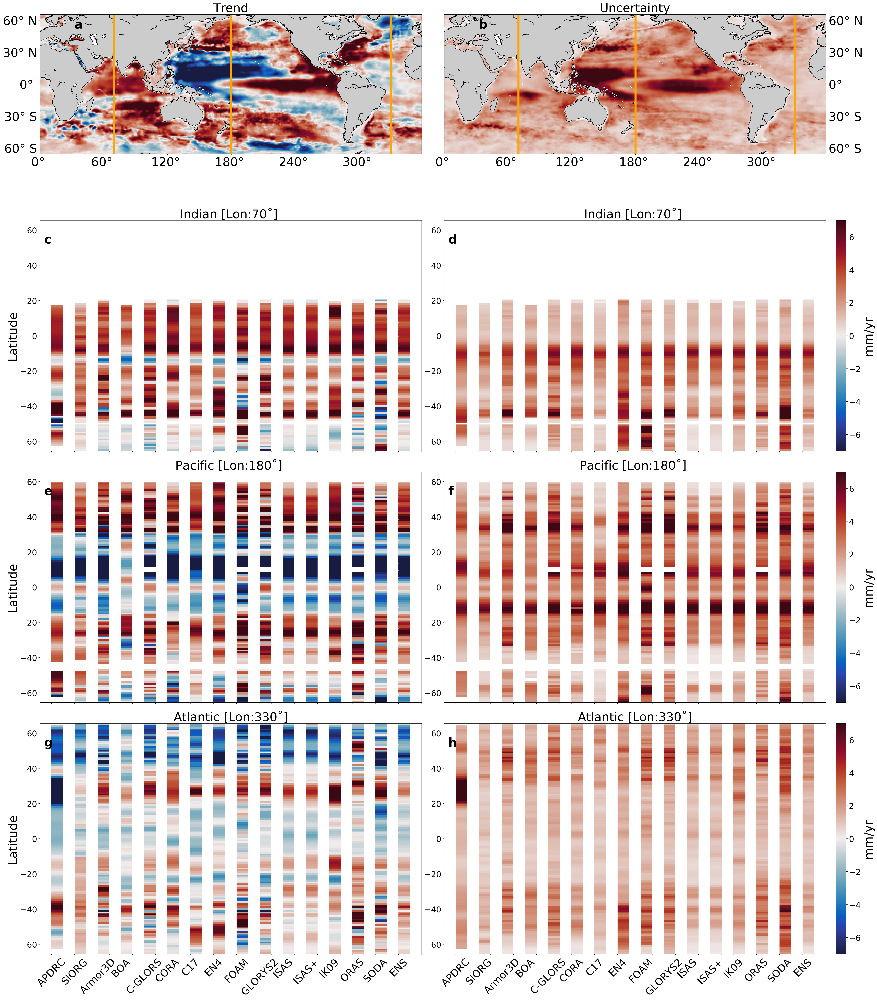

In [12]:

#%%
fig=plt.figure(figsize=(35,45),dpi=200)
gs = GridSpec(8, 6, figure=fig)

# trend map

ax = plt.subplot(gs.new_subplotspec((0, 0), colspan=3,rowspan=2))
data=trendmap

m=Basemap(projection='cyl',
              llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
               llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
                resolution='c')   
    
m.pcolormesh(lon,lat,data,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
    
    
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()

m.drawparallels([0])
#m.drawmeridians([180])

#deg=np.arange(0,360,60)
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
lblon=lblon
ax.set_xticks(deg)
ax.set_xticklabels(lblon,fontsize=30)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
lblat=lblat
ax.set_yticks(deg)
ax.set_yticklabels(lblat,fontsize=30)

# Draw lines:
df = pd.DataFrame({"lon1" : [70,180,330],
                   "lat1" : [lat[0],lat[0],lat[0]],
                   "lon2" : [70,180,330],
                   "lat2" : [lat[-1],lat[-1],lat[-1]]
                  })
lon1, lat1 = m(df.lon1.values, df.lat1.values)
lon2, lat2 = m(df.lon2.values, df.lat2.values)

pts = np.c_[lon1, lat1, lon2, lat2].reshape(len(lon1), 2, 2)
plt.gca().add_collection(LineCollection(pts, color="orange", label="Lines",linewidth=5))
ax.text(0.08,0.9,' a ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax.transAxes)
plt.title('Trend',fontsize=30)


# Unc map
ax = plt.subplot(gs.new_subplotspec((0, 3), colspan=3,rowspan=2))
data=uncmap

m=Basemap(projection='cyl',
              llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
               llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
                resolution='c')   
    
m.pcolormesh(lon,lat,data,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
    
    
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()

m.drawparallels([0])
#m.drawmeridians([180])


deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
lblon=lblon
ax.set_xticks(deg)
ax.set_xticklabels(lblon,fontsize=30)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
lblat=lblat
ax.yaxis.set_label_position("right")
ax.yaxis.tick_right()
ax.set_yticks(deg)
ax.set_yticklabels(lblat,fontsize=30)

# Draw lines:
df = pd.DataFrame({"lon1" : [70,180,330],
                   "lat1" : [lat[0],lat[0],lat[0]],
                   "lon2" : [70,180,330],
                   "lat2" : [lat[-1],lat[-1],lat[-1]]
                  })
lon1, lat1 = m(df.lon1.values, df.lat1.values)
lon2, lat2 = m(df.lon2.values, df.lat2.values)

pts = np.c_[lon1, lat1, lon2, lat2].reshape(len(lon1), 2, 2)
plt.gca().add_collection(LineCollection(pts, color="orange", label="Lines",linewidth=5))
ax.text(0.08,0.9,' b ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax.transAxes)
plt.title('Uncertainty',fontsize=30)



#Transects
cmap=cm.cm.balance
cmap.set_bad('white',1)
# Indian
#trend
ax1 = plt.subplot(gs.new_subplotspec((2, 0),colspan=3,rowspan=2))
data=np.array(x[:,:,70])
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
plt.title('\nIndian [Lon:70˚] ',fontsize=30)
plt.xticks(ind,'',rotation=30)
ax1.text(0,0.9,' c ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Pacific
#trend
ax1 = plt.subplot(gs.new_subplotspec((4, 0),colspan=3,rowspan=2))
data=x[:,:,170]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.title('\nPacific [Lon:180˚] ',fontsize=30)
#plt.title('Trend')
plt.xticks(ind,'',rotation=30)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' e ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Atlantic
#trend
ax1 = plt.subplot(gs.new_subplotspec((6, 0),colspan=3,rowspan=2))
data=x[:,:,330]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.title('\nAtlantic [Lon:330˚]',fontsize=30)
#plt.title('Trend')
plt.xticks(ind,lb,rotation=45,fontsize=25)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' g ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)


# Indian
#Uncertainty
ax1 = plt.subplot(gs.new_subplotspec((2, 3),colspan=3,rowspan=2))
data=x2[:,:,70]
data_t=data.transpose()
im=plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Uncertainty (mm/yr)',fontsize=12)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
plt.title('\nIndian [Lon:70˚] ',fontsize=30)
plt.xticks(ind,'',rotation=30)
ax1.text(0,0.9,' d ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Pacific
#Uncertainty
ax2 = plt.subplot(gs.new_subplotspec((4, 3),colspan=3,rowspan=2))
data=x2[:,:,170]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Uncertainty (mm/yr)',fontsize=12)
plt.title('\nPacific [Lon:180˚] ',fontsize=30)
#plt.title('Uncertainty')
plt.xticks(ind,'',rotation=45,fontsize=25)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
ax2.text(0,0.9,' f ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax2.transAxes)


# Atlantic
#Uncertainty
ax3 = plt.subplot(gs.new_subplotspec((6, 3),colspan=3,rowspan=2))
data=x2[:,:,330]
data_t=data.transpose()
im=plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
plt.title('\nAtlantic [Lon:330˚]',fontsize=30)
#plt.title('Uncertainty')
plt.xticks(ind,lb,rotation=45,fontsize=25)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
ax3.text(0,0.9,' h ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax3.transAxes)

#fig.tight_layout()

cax = fig.add_axes([ax1.get_position().x1+0.01,ax1.get_position().y0,
                    0.01, # width
                    ax1.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

cax = fig.add_axes([ax2.get_position().x1+0.01,ax2.get_position().y0,
                    0.01, # width
                    ax2.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

cax = fig.add_axes([ax3.get_position().x1+0.01,ax3.get_position().y0,
                    0.01, # width
                    ax3.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

plt.show()


fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/5_datasets_AR1.png',
            format='png',dpi=200,bbox_inches='tight')
fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/5_datasets_AR1.pdf',
            format='pdf',dpi=200,bbox_inches='tight')

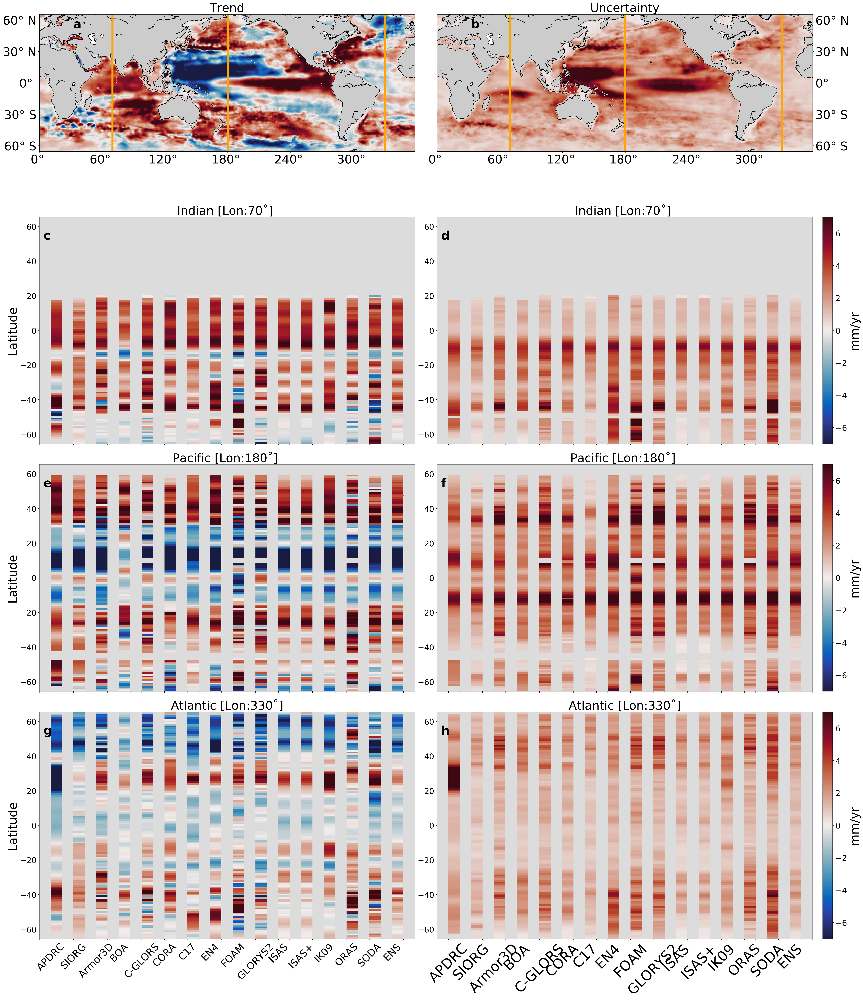

In [13]:

#%%
fig=plt.figure(figsize=(35,45),dpi=200)
gs = GridSpec(8, 6, figure=fig)

# trend map

ax = plt.subplot(gs.new_subplotspec((0, 0), colspan=3,rowspan=2))
data=trendmap

m=Basemap(projection='cyl',
              llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
               llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
                resolution='c')   
    
m.pcolormesh(lon,lat,data,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
    
    
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()

m.drawparallels([0])
#m.drawmeridians([180])

#deg=np.arange(0,360,60)
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
lblon=lblon
ax.set_xticks(deg)
ax.set_xticklabels(lblon,fontsize=30)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
lblat=lblat
ax.set_yticks(deg)
ax.set_yticklabels(lblat,fontsize=30)

# Draw lines:
df = pd.DataFrame({"lon1" : [70,180,330],
                   "lat1" : [lat[0],lat[0],lat[0]],
                   "lon2" : [70,180,330],
                   "lat2" : [lat[-1],lat[-1],lat[-1]]
                  })
lon1, lat1 = m(df.lon1.values, df.lat1.values)
lon2, lat2 = m(df.lon2.values, df.lat2.values)

pts = np.c_[lon1, lat1, lon2, lat2].reshape(len(lon1), 2, 2)
plt.gca().add_collection(LineCollection(pts, color="orange", label="Lines",linewidth=5))
ax.text(0.08,0.9,' a ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax.transAxes)
plt.title('Trend',fontsize=30)


# Unc map
ax = plt.subplot(gs.new_subplotspec((0, 3), colspan=3,rowspan=2))
data=uncmap

m=Basemap(projection='cyl',
              llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
               llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
                resolution='c')   
    
m.pcolormesh(lon,lat,data,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
    
    
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()

m.drawparallels([0])
#m.drawmeridians([180])


deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
lblon=lblon
ax.set_xticks(deg)
ax.set_xticklabels(lblon,fontsize=30)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
lblat=lblat
ax.yaxis.set_label_position("right")
ax.yaxis.tick_right()
ax.set_yticks(deg)
ax.set_yticklabels(lblat,fontsize=30)

# Draw lines:
df = pd.DataFrame({"lon1" : [70,180,330],
                   "lat1" : [lat[0],lat[0],lat[0]],
                   "lon2" : [70,180,330],
                   "lat2" : [lat[-1],lat[-1],lat[-1]]
                  })
lon1, lat1 = m(df.lon1.values, df.lat1.values)
lon2, lat2 = m(df.lon2.values, df.lat2.values)

pts = np.c_[lon1, lat1, lon2, lat2].reshape(len(lon1), 2, 2)
plt.gca().add_collection(LineCollection(pts, color="orange", label="Lines",linewidth=5))
ax.text(0.08,0.9,' b ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax.transAxes)
plt.title('Uncertainty',fontsize=30)



#Transects
cmap=cm.cm.balance
cmap.set_bad('gainsboro',1)
# Indian
#trend
ax1 = plt.subplot(gs.new_subplotspec((2, 0),colspan=3,rowspan=2))
data=np.array(x[:,:,70])
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
plt.title('\nIndian [Lon:70˚] ',fontsize=30)
plt.xticks(ind,'',rotation=30)
ax1.text(0,0.9,' c ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Pacific
#trend
ax1 = plt.subplot(gs.new_subplotspec((4, 0),colspan=3,rowspan=2))
data=x[:,:,170]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.title('\nPacific [Lon:180˚] ',fontsize=30)
#plt.title('Trend')
plt.xticks(ind,'',rotation=30)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' e ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Atlantic
#trend
ax1 = plt.subplot(gs.new_subplotspec((6, 0),colspan=3,rowspan=2))
data=x[:,:,330]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.title('\nAtlantic [Lon:330˚]',fontsize=30)
#plt.title('Trend')
plt.xticks(ind,lb,rotation=45,fontsize=25)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' g ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)


# Indian
#Uncertainty
ax1 = plt.subplot(gs.new_subplotspec((2, 3),colspan=3,rowspan=2))
data=x2[:,:,70]
data_t=data.transpose()
im=plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Uncertainty (mm/yr)',fontsize=12)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
plt.title('\nIndian [Lon:70˚] ',fontsize=30)
plt.xticks(ind,'',rotation=30)
ax1.text(0,0.9,' d ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Pacific
#Uncertainty
ax2 = plt.subplot(gs.new_subplotspec((4, 3),colspan=3,rowspan=2))
data=x2[:,:,170]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Uncertainty (mm/yr)',fontsize=12)
plt.title('\nPacific [Lon:180˚] ',fontsize=30)
#plt.title('Uncertainty')
plt.xticks(ind,'',rotation=30)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
ax2.text(0,0.9,' f ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax2.transAxes)


# Atlantic
#Uncertainty
ax3 = plt.subplot(gs.new_subplotspec((6, 3),colspan=3,rowspan=2))
data=x2[:,:,330]
data_t=data.transpose()
im=plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cmap)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
plt.title('\nAtlantic [Lon:330˚]',fontsize=30)
#plt.title('Uncertainty')
plt.xticks(ind,lb,rotation=45,fontsize=35)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
ax3.text(0,0.9,' h ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax3.transAxes)

#fig.tight_layout()

cax = fig.add_axes([ax1.get_position().x1+0.01,ax1.get_position().y0,
                    0.01, # width
                    ax1.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

cax = fig.add_axes([ax2.get_position().x1+0.01,ax2.get_position().y0,
                    0.01, # width
                    ax2.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

cax = fig.add_axes([ax3.get_position().x1+0.01,ax3.get_position().y0,
                    0.01, # width
                    ax3.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

plt.show()


Figure 5. Trend and uncertainty varying with the datasets for AR1 noise model. 

## Figure 6

In [14]:
ds2=xr.open_dataset('~/Desktop/paper1/steric/data/pub/landmask_etopo1_360x132.nc')
ds2
lat=np.array(ds2.lat)
lon=np.array(ds2.lon)
mask=np.array(ds2.mask)

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_2005-2015.nc')
ds

#ax = plt.subplot(111, projection=ccrs.Mercator())
#mm = ax.pcolor(lon,lat, mask,vmin=0, vmax=1,transform=ccrs.Mercator(),cmap=cmo.balance )
#plt.show()
nm=np.array(ds.nm)
name=np.array(ds.fname)
i=18
name[i]
trend=np.array(ds.trend[i,:,:,:]) # AR1
trend=mask*trend
unc=np.array(ds.unc[i,:,:,:])
unc=unc*mask


# Create 'empty' columns for plotting:
k=len(nm)*2
x=np.zeros((k+2,len(lat),len(lon)))
x.fill('nan')
y=np.arange(1,k,2)
for i,j in enumerate(y):
    x[j,:,:]=trend[i,:,:]

x2=np.zeros((k+2,len(lat),len(lon)))
x2.fill('nan')
y=np.arange(1,k,2)
for i,j in enumerate(y):
    x2[j,:,:]=unc[i,:,:]


ind=np.arange(0,k+2)

#%%
lb=([None])*(k+2)
j=0
for i in range(k):
    if i % 2 == 0:
        lb[i]=''
    else:
        lb[i]=nm[j]
        j=j+1
lb[k]=''
lb[k+1]=''

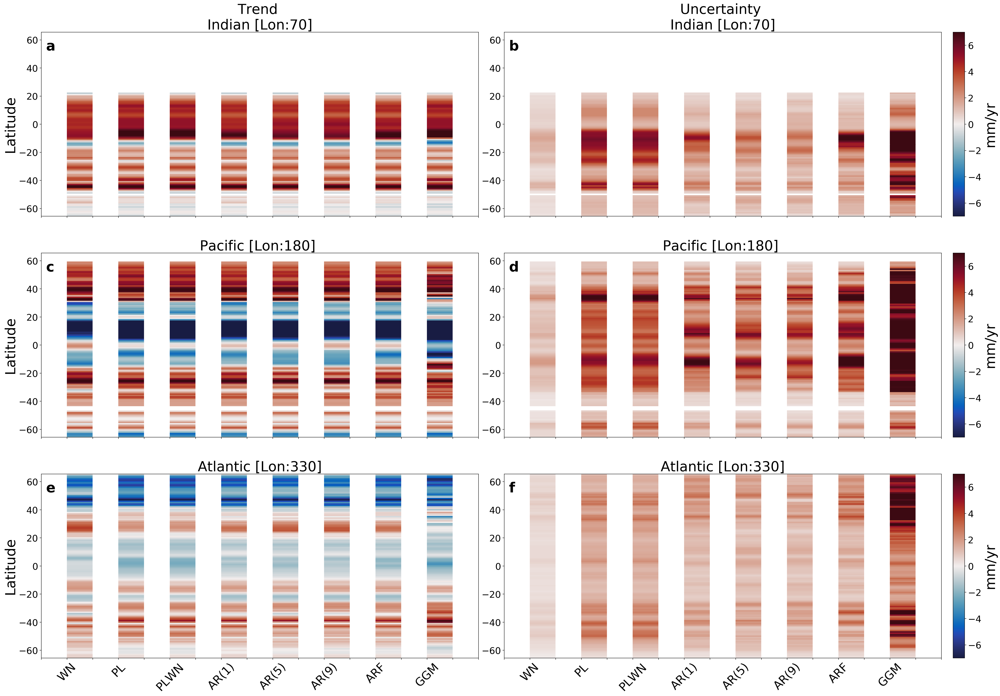

In [15]:
cmap.set_bad('white',1)

#%%
fig=plt.figure(figsize=(35,25),dpi=200)
gs = GridSpec(3, 6, figure=fig)

# Indian
#trend
ax1 = plt.subplot(gs.new_subplotspec((0, 0),colspan=3))
data=np.array(x[:,:,69])
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
plt.title('Trend \n Indian [Lon:70] ',fontsize=30)
plt.xticks(ind,'',rotation=30)
ax1.text(0,0.9,' a ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Pacific
#trend
ax1 = plt.subplot(gs.new_subplotspec((1, 0),colspan=3))
data=x[:,:,170]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.title('Pacific [Lon:180] ',fontsize=30)
#plt.title('Trend')
plt.xticks(ind,'',rotation=30)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' c ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Atlantic
#trend
ax1 = plt.subplot(gs.new_subplotspec((2, 0),colspan=3))
data=x[:,:,330]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.title('Atlantic [Lon:330]',fontsize=30)
#plt.title('Trend')
plt.xticks(ind,lb,rotation=45,fontsize=25)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' e ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Indian
#Uncertainty
ax1 = plt.subplot(gs.new_subplotspec((0, 3),colspan=3))
data=x2[:,:,69]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Uncertainty (mm/yr)',fontsize=12)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
plt.title('Uncertainty \n Indian [Lon:70] ',fontsize=30)
plt.xticks(ind,'',rotation=30)
ax1.text(0,0.9,' b ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)
cax = fig.add_axes([ax1.get_position().x1+0.01,ax1.get_position().y0,
                    0.01, # width
                    ax1.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

# Pacific
#Uncertainty
ax1 = plt.subplot(gs.new_subplotspec((1, 3),colspan=3))
data=x2[:,:,170]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Uncertainty (mm/yr)',fontsize=12)
plt.title('Pacific [Lon:180] ',fontsize=30)
#plt.title('Uncertainty')
plt.xticks(ind,'',rotation=30)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' d ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)
cax = fig.add_axes([ax1.get_position().x1+0.01,ax1.get_position().y0,
                    0.01, # width
                    ax1.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

# Atlantic
#Uncertainty
ax1 = plt.subplot(gs.new_subplotspec((2, 3),colspan=3))
data=x2[:,:,330]
data_t=data.transpose()
im=plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
plt.title('Atlantic [Lon:330]',fontsize=30)
#plt.title('Uncertainty')
plt.xticks(ind,lb,rotation=45,fontsize=25)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' f ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)
cax = fig.add_axes([ax1.get_position().x1+0.01,ax1.get_position().y0,
                    0.01, # width
                    ax1.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

plt.show()


fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/6_regionaldist_ENS_nm_2005.pdf',
            format='pdf',dpi=200,bbox_inches='tight')

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/6_regionaldist_ENS_nm_2005.png',
            format='png',dpi=200,bbox_inches='tight')



Figure 6. Regional variation of the ENS from 2005-2015 according to the noise model being used. 

## Figure 7

In [16]:
ds2=xr.open_dataset('~/Desktop/paper1/steric/data/pub/landmask_etopo1_360x132.nc')
ds2
lat=np.array(ds2.lat)
lon=np.array(ds2.lon)
mask=np.array(ds2.mask)

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_2005-2015.nc')
ds

nm=np.array(ds.nm)
name=np.array(ds.fname)
i=18
name[i]
name=name[i]
trend=np.array(ds.trend[i,:,:,:]) # AR1
trend=mask*trend
unc=np.array(ds.unc[i,:,:,:])
unc=unc*mask
aic=np.array(ds.aic[i,:,:,:])
bic=np.array(ds.bic[i,:,:,:])
aicbic=np.nanmean([aic,bic],axis=0)

#%%
aic=aic*mask
bic=bic*mask
aicbic=aicbic*mask
#%%
rkb=np.zeros((len(lat),len(lon)))
rkb[:,:]='nan'
rka=np.zeros((len(lat),len(lon)))
rka[:,:]='nan'
rk=np.zeros((len(lat),len(lon)))
rk[:,:]='nan'


ilat=ilon=j=5
for ilat,l in enumerate(lat):
    for ilon,l in enumerate(lon):
        
        if ~np.isnan(mask[ilat,ilon]):
            targeta=aic[:,ilat,ilon] # All datasets and noise-models for this lat and lon
            targetb=bic[:,ilat,ilon]       
            target=aicbic[:,ilat,ilon]
            
            bic2=np.zeros((len(name),len(nm)))
            aic2=np.zeros((len(name),len(nm)))
            aicbic2=np.zeros((len(name),len(nm)))
    
            for iname in np.arange(0,len(name)):
                
##                AIC
                tg=targeta[:] # all noise models for this dataset
                logaic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logaic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logaic 
                indaic=np.where(logaic>0.5)
                indaic=np.array(indaic)
                for inm in np.arange(0,len(nm)):
                    for ind in indaic:
                        for ind2 in ind:
                            if inm==ind2:        
                                aic2[iname,inm]=1
#                
                
                #BIC
                tg=targetb[:]
                tg
                logbic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logbic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logbic 
                indbic=np.where(logbic>0.5)
                indbic=np.array(indbic)
                indbic
                for inm in np.arange(0,len(nm)):
                    for ind in indbic:
                        for ind2 in ind:
                            if inm==ind2:        
                                bic2[iname,inm]=1
                #AIC|BIC
                tg=target[:]
                tg
                logab=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logab[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logab 
                indab=np.where(logab>0.5)
                indab=np.array(indab)
                indab
                for inm in np.arange(0,len(nm)):
                    for ind in indab:
                        for ind2 in ind:
                            if inm==ind2:        
                                aicbic2[iname,inm]=1
                                
            
            indaic=np.sum(aic2,axis=0)                   
            tmp=np.array(np.where(indaic==np.nanmax(indaic)))
            rka[ilat,ilon]=tmp[0,0]
            
            indbic=np.sum(bic2,axis=0)
            tmp=np.array(np.where(indbic==np.nanmax(indbic)))
            rkb[ilat,ilon]=tmp[0,0]

            indab=np.sum(aicbic2,axis=0)
            tmp=np.array(np.where(indab==np.nanmax(indab)))
            rk[ilat,ilon]=tmp[0,0]

            
#%%
rka05=np.array(rka)
rkb05=np.array(rkb)
rk05=np.array(rk)
trend05=np.array(trend)
unc05=np.array(unc)


#%%
#1993-2017

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_1993-2017.nc')
ds

nm=np.array(ds.nm)
name=np.array(ds.fname)
i=12 # ensemble mean
name[i]
name=name[i]
trend=np.array(ds.trend[i,:,:,:]) # AR1
trend=mask*trend
unc=np.array(ds.unc[i,:,:,:])
unc=unc*mask
aic=np.array(ds.aic[i,:,:,:])
bic=np.array(ds.bic[i,:,:,:])
aicbic=np.nanmean([aic,bic],axis=0)

#%%
aic=aic*mask
bic=bic*mask
aicbic=aicbic*mask
#%%
rkb=np.zeros((len(lat),len(lon)))
rkb[:,:]='nan'
rka=np.zeros((len(lat),len(lon)))
rka[:,:]='nan'
rk=np.zeros((len(lat),len(lon)))
rk[:,:]='nan'


ilat=ilon=j=5
for ilat,l in enumerate(lat):
    for ilon,l in enumerate(lon):
        
        if ~np.isnan(mask[ilat,ilon]):
            targeta=aic[:,ilat,ilon] # All datasets and noise-models for this lat and lon
            targetb=bic[:,ilat,ilon]       
            target=aicbic[:,ilat,ilon]
            
            bic2=np.zeros((len(name),len(nm)))
            aic2=np.zeros((len(name),len(nm)))
            aicbic2=np.zeros((len(name),len(nm)))
    
            for iname in np.arange(0,len(name)):
                
##                AIC
                tg=targeta[:] # all noise models for this dataset
                logaic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logaic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logaic 
                indaic=np.where(logaic>0.5)
                indaic=np.array(indaic)
                for inm in np.arange(0,len(nm)):
                    for ind in indaic:
                        for ind2 in ind:
                            if inm==ind2:        
                                aic2[iname,inm]=1
#                
                
                #BIC
                tg=targetb[:]
                tg
                logbic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logbic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logbic 
                indbic=np.where(logbic>0.5)
                indbic=np.array(indbic)
                indbic
                for inm in np.arange(0,len(nm)):
                    for ind in indbic:
                        for ind2 in ind:
                            if inm==ind2:        
                                bic2[iname,inm]=1
                #AIC|BIC
                tg=target[:]
                tg
                logab=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logab[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logab 
                indab=np.where(logab>0.5)
                indab=np.array(indab)
                indab
                for inm in np.arange(0,len(nm)):
                    for ind in indab:
                        for ind2 in ind:
                            if inm==ind2:        
                                aicbic2[iname,inm]=1
                                
            
            indaic=np.sum(aic2,axis=0)                   
            tmp=np.array(np.where(indaic==np.nanmax(indaic)))
            rka[ilat,ilon]=tmp[0,0]
            
            indbic=np.sum(bic2,axis=0)
            tmp=np.array(np.where(indbic==np.nanmax(indbic)))
            rkb[ilat,ilon]=tmp[0,0]

            indab=np.sum(aicbic2,axis=0)
            tmp=np.array(np.where(indab==np.nanmax(indab)))
            rk[ilat,ilon]=tmp[0,0]

#%%
rka93=np.array(rka)
rkb93=np.array(rkb)
rk93=np.array(rk)
trend93=np.array(trend)
unc93=np.array(unc)

#%%
# Compute % of grid cells and % ocean area for each noise model, according to each selection criterea and time period

data=rka05

perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df=pd.DataFrame(rel_area,columns=['aic_area05'])
df['aic_grid05']=perc

#%%
data=rkb05
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['bic_area05']=rel_area
df['bic_grid05']=perc

#%%
data=rk05
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['aicbic_area05']=rel_area
df['aicbic_grid05']=perc

#%%
data=rka93

perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['aic_area93']=rel_area
df['aic_grid93']=perc

#%%
data=rkb93
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['bic_area93']=rel_area
df['bic_grid93']=perc

#%%
data=rk93
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['aicbic_area93']=rel_area
df['aicbic_grid93']=perc

df

,aic_area05,aic_grid05,bic_area05,bic_grid05,aicbic_area05,aicbic_grid05,aic_area93,aic_grid93,bic_area93,bic_grid93,aicbic_area93,aicbic_grid93
0,0.122739,0.130803,0.349977,0.354620,0.217479,0.220911,0.112873,0.124989,0.122293,0.136616,0.118865,0.133709
1,0.804054,0.810976,2.914987,3.191582,1.972296,2.092841,0.341487,0.340087,2.076244,2.055053,1.300939,1.258611
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,35.616752,36.031741,73.267670,73.269773,59.133282,59.413423,18.481432,18.818126,54.233156,55.221928,40.058138,40.868529
4,40.920720,39.243671,16.623577,15.917217,27.985791,26.861030,53.385800,50.972299,30.592315,28.930617,43.689372,41.481848
5,20.624662,21.998082,2.942455,3.688632,7.062704,8.103944,25.579872,27.558643,4.112202,5.078046,8.830730,10.275267
6,1.911073,1.784728,3.891687,3.566549,3.617722,3.299131,2.094435,2.180042,8.729278,8.414964,5.937535,5.906462
7,0.000000,0.000000,0.009647,0.011627,0.010726,0.008720,0.004101,0.005813,0.134512,0.162777,0.064421,0.075575


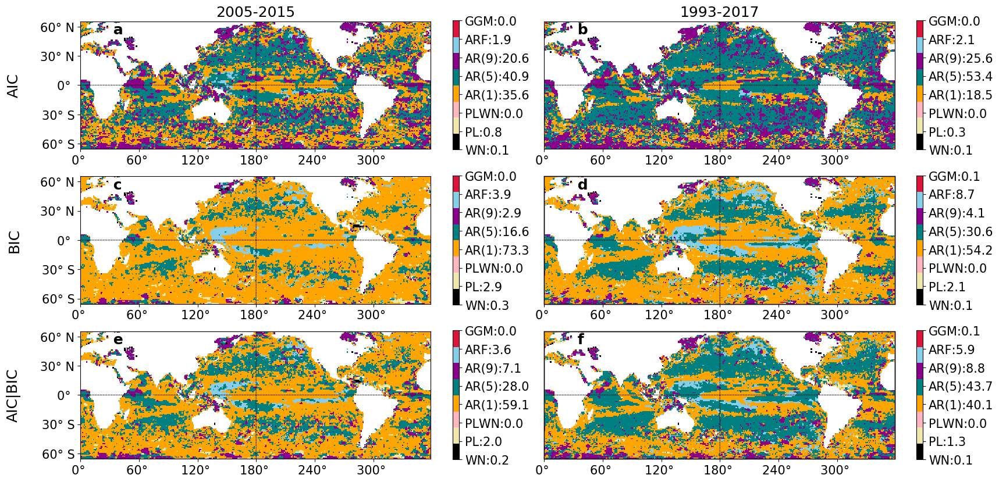

In [17]:
fig=plt.figure(figsize=(20,10),dpi=100)
gs = GridSpec(3, 6, figure=fig)

cmax=7
cmin=0
cmap=plt.cm.get_cmap('Set3', cmax+1)

# AIC
ax1 = plt.subplot(gs.new_subplotspec((0, 0),colspan=3))
data=rka05

perc=np.array(df.aic_area05)

lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )



m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
plt.title('2005-2015',fontsize=18)

ax1.text(0.08,0.90,' a ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)
plt.ylabel('AIC\n',fontsize=18)


#%
#########################
# BIC
ax1 = plt.subplot(gs.new_subplotspec((1, 0),colspan=3))

data=rkb05
perc=np.array(df.bic_area05)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )
    

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
plt.ylabel('BIC\n',fontsize=18)
ax1.text(0.08,0.90,' c ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)
#plt.ylabel('Latitude\n',fontsize=15)


####################
# AIC|BIC
ax1 = plt.subplot(gs.new_subplotspec((2, 0),colspan=3))

data=rk05
perc=np.array(df.aicbic_area05)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )
    


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
plt.ylabel('AIC|BIC\n',fontsize=18)
ax1.text(0.08,0.90,' e ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)
#plt.ylabel('Latitude\n',fontsize=15)
#plt.xlabel('\nLongitude',fontsize=15)

##################
#################
# AIC
ax1 = plt.subplot(gs.new_subplotspec((0, 3),colspan=3))
data=rka93

perc=np.array(df.aic_area93)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

#deg=np.arange(-60,61,30)
#lblat=[None]*len(deg)
#for i,d in enumerate(deg): lblat[i]=lat2str(d)
#ax1.set_yticks(deg)
#ax1.set_yticklabels(lblat,fontsize=15)



cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')

cbar.ax.tick_params(labelsize=12)
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbarcbar.ax.set_xticklabels(lb,fontsize=10,rotation=45) # horizontally oriented colorbar
plt.title('1993-2017',fontsize=18)

ax1.text(0.08,0.90,' b ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)

#%
#########################
# BIC
ax1 = plt.subplot(gs.new_subplotspec((1, 3),colspan=3))

data=rkb93
perc=np.array(df.bic_area93)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

#deg=np.arange(-60,61,30)
#lblat=[None]*len(deg)
#for i,d in enumerate(deg): lblat[i]=lat2str(d)
#ax1.set_yticks(deg)
#ax1.set_yticklabels(lblat,fontsize=15)



m.drawmapboundary()


cbar=plt.colorbar(cax,ticks=range(len(nm)), 
                  #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
#plt.title('BIC',fontsize=18)
ax1.text(0.08,0.90,' d ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)

####################
# AIC|BIC
ax1 = plt.subplot(gs.new_subplotspec((2, 3),colspan=3))

data=rk93
perc=np.array(df.aicbic_area93)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )
    


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

#deg=np.arange(-60,61,30)
#lblat=[None]*len(deg)
#for i,d in enumerate(deg): lblat[i]=lat2str(d)
#ax1.set_yticks(deg)
#ax1.set_yticklabels(lblat,fontsize=15)


m.drawmapboundary()

##plt.xlabel('\nLongitude',fontsize=15)
cbar=plt.colorbar(cax,ticks=range(len(nm)), 
                  ##shrink=0.95,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
#plt.title('AIC|BIC',fontsize=18)
ax1.text(0.08,0.90,' f ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)



plt.show()


fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/7_NM_scores_ENS.pdf',
            format='pdf',dpi=200,bbox_inches='tight')

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/7_NM_scores_ENS.png',
            format='png',dpi=200,bbox_inches='tight')


Figure 7. Regional NM selection for the ENS with the repsecitve percentage of total ocean area selected by each NM. 

# Figure 8

In [18]:
#Figure 8 - needs data from Figure 7!

#2005-2015
trend_aic05=np.zeros((len(lat),len(lon)))
trend_aic05.fill('nan')
trend_bic05=np.zeros((len(lat),len(lon)))
trend_bic05.fill('nan')
trend_aicbic05=np.zeros((len(lat),len(lon)))
trend_aicbic05.fill('nan')

unc_aic05=np.zeros((len(lat),len(lon)))
unc_aic05.fill('nan')
unc_bic05=np.zeros((len(lat),len(lon)))
unc_bic05.fill('nan')
unc_aicbic05=np.zeros((len(lat),len(lon)))
unc_aicbic05.fill('nan')
for ilat,l in enumerate(lat):
    for ilon,l in enumerate(lon):
            ind=np.array(rka05[ilat,ilon])
            if np.isnan(ind):
                trend_aic05[ilat,ilon]='nan'
                unc_aic05[ilat,ilon]='nan'
            else:
                trend_aic05[ilat,ilon]=trend05[int(ind),ilat,ilon]
                unc_aic05[ilat,ilon]=unc05[int(ind),ilat,ilon]
            
            ind=np.array(rkb05[ilat,ilon])
            if np.isnan(ind):
                trend_bic05[ilat,ilon]='nan'
                unc_bic05[ilat,ilon]='nan'
            else:
                trend_bic05[ilat,ilon]=trend05[int(ind),ilat,ilon]
                unc_bic05[ilat,ilon]=unc05[int(ind),ilat,ilon]
            
            ind=np.array(rk05[ilat,ilon])
            if np.isnan(ind):
                trend_aicbic05[ilat,ilon]='nan'
                unc_aicbic05[ilat,ilon]='nan'
            else:
                trend_aicbic05[ilat,ilon]=trend05[int(ind),ilat,ilon]
                unc_aicbic05[ilat,ilon]=unc05[int(ind),ilat,ilon]


In [19]:
#1993-2017
trend_aic93=np.zeros((len(lat),len(lon)))
trend_aic93.fill('nan')
trend_bic93=np.zeros((len(lat),len(lon)))
trend_bic93.fill('nan')
trend_aicbic93=np.zeros((len(lat),len(lon)))
trend_aicbic93.fill('nan')

unc_aic93=np.zeros((len(lat),len(lon)))
unc_aic93.fill('nan')
unc_bic93=np.zeros((len(lat),len(lon)))
unc_bic93.fill('nan')
unc_aicbic93=np.zeros((len(lat),len(lon)))
unc_aicbic93.fill('nan')
for ilat,l in enumerate(lat):
    for ilon,l in enumerate(lon):
            ind=np.array(rka93[ilat,ilon])
            if np.isnan(ind):
                trend_aic93[ilat,ilon]='nan'
                unc_aic93[ilat,ilon]='nan'
            else:
                trend_aic93[ilat,ilon]=trend93[int(ind),ilat,ilon]
                unc_aic93[ilat,ilon]=unc93[int(ind),ilat,ilon]
            
            ind=np.array(rkb93[ilat,ilon])
            if np.isnan(ind):
                trend_bic93[ilat,ilon]='nan'
                unc_bic93[ilat,ilon]='nan'
            else:
                trend_bic93[ilat,ilon]=trend93[int(ind),ilat,ilon]
                unc_bic93[ilat,ilon]=unc93[int(ind),ilat,ilon]
            
            ind=np.array(rk93[ilat,ilon])
            if np.isnan(ind):
                trend_aicbic93[ilat,ilon]='nan'
                unc_aicbic93[ilat,ilon]='nan'
            else:
                trend_aicbic93[ilat,ilon]=trend93[int(ind),ilat,ilon]
                unc_aicbic93[ilat,ilon]=unc93[int(ind),ilat,ilon]


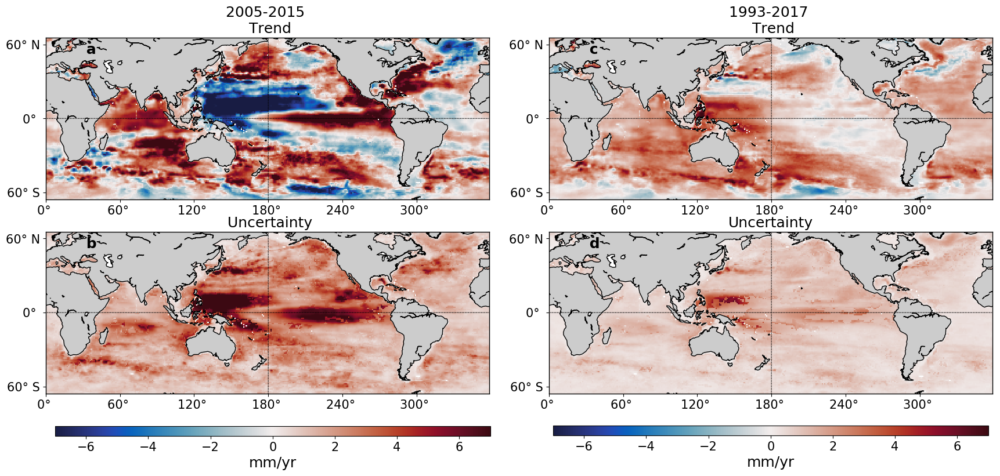

In [20]:
fig, ax = plt.subplots(figsize=(22,17),dpi=100)
#fig.suptitle('Ensemble',fontsize=20)
gs = GridSpec(4,10, figure=fig)

# Trend
ax1 = plt.subplot(gs.new_subplotspec((0, 0),colspan=5))
cmin=-7;cmax=7;cmap=cm.cm.balance
data=trend_aicbic05 
m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()
plt.title('2005-2015 \n Trend',fontsize=18)
m.drawparallels([0])
m.drawmeridians([180])
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)
ax1.text(0.08,0.90,' a ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Uncertainty
ax2 = plt.subplot(gs.new_subplotspec((1, 0),colspan=5))
cmin=-7;cmax=7;cmap=cm.cm.balance
data=unc_aicbic05 
m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()
plt.title(' Uncertainty',fontsize=18)
m.drawparallels([0])
m.drawmeridians([180])
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax2.set_xticks(deg)
ax2.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax2.set_yticks(deg)
ax2.set_yticklabels(lblat,fontsize=15)

ax2.text(0.08,0.90,' b ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax2.transAxes)

# 1993 - 2017

ax3 = plt.subplot(gs.new_subplotspec((0, 5),colspan=5))
cmin=-7;cmax=7;cmap=cm.cm.balance
data=trend_aicbic93 
m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()
plt.title('1993-2017 \n Trend',fontsize=18)
m.drawparallels([0])
m.drawmeridians([180])
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax3.set_xticks(deg)
ax3.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax3.set_yticks(deg)
ax3.set_yticklabels(lblat,fontsize=15)
ax3.text(0.08,0.90,' c ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax3.transAxes)

##
ax4 = plt.subplot(gs.new_subplotspec((1, 5),colspan=5))
cmin=-7;cmax=7;cmap=cm.cm.balance
data=unc_aicbic93 
m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()
m.drawparallels([0])
m.drawmeridians([180])
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax4.set_xticks(deg)
ax4.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax4.set_yticks(deg)
ax4.set_yticklabels(lblat,fontsize=15)
plt.title('Uncertainty',fontsize=18)

ax4.text(0.08,0.90,' d ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax4.transAxes)


cax = fig.add_axes([ax4.get_position().y0+0.02, # x position
                    ax4.get_position().x0-0.0425, # y position 
                    ax4.get_position().width-0.04, # width
                    0.01]) # height
cbar=plt.colorbar(cax=cax, orientation='horizontal') # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=18)
cbar.ax.tick_params(labelsize=15)

cax = fig.add_axes([ax2.get_position().y0-0.37, # x position
                    ax2.get_position().x1-0.03, # y position 
                    ax2.get_position().width-0.04, # width
                    0.01]) # height
cbar=plt.colorbar( cax=cax, orientation='horizontal') # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=18)
cbar.ax.tick_params(labelsize=15)

plt.show()

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/8_ENS_preferred_NM.pdf',
            format='pdf',dpi=200,bbox_inches='tight')

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/8_ENS_preferred_NM.png',
            format='png',dpi=200,bbox_inches='tight')


Figure 8. Trend and Uncertainty for the ensemble mean using the preferred noise model according to mean(AIC,BIC) for each grid. 

# Supplementary

Figure S1. Power spectrum from matlab

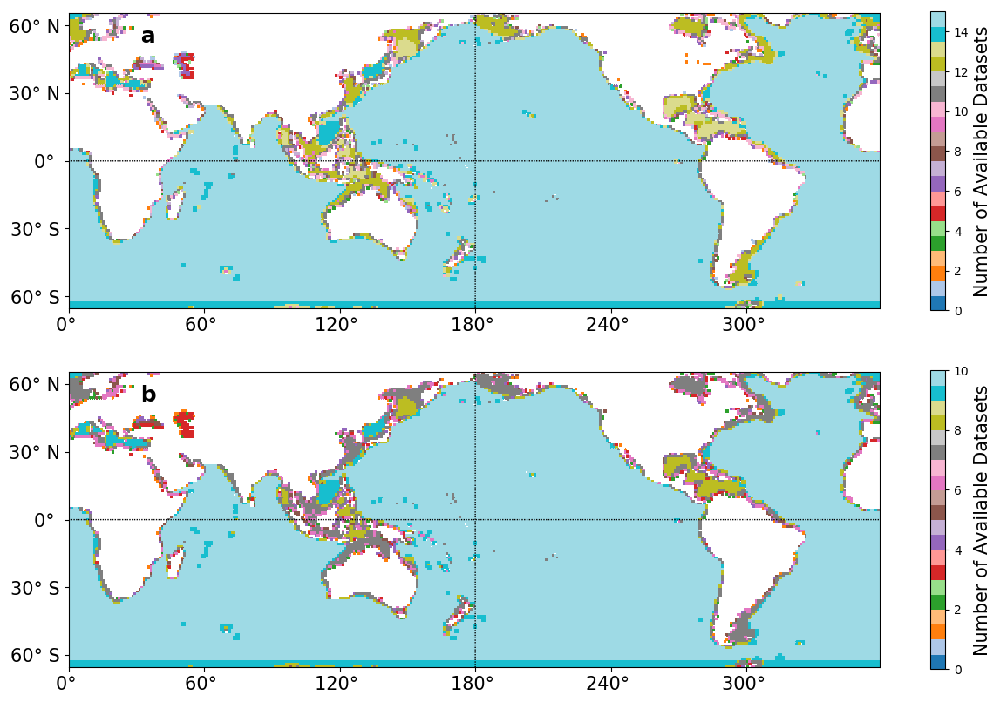

In [21]:

#%%
#datasets name based on flist
#ds=xr.open_dataset('/Users/ccamargo/Desktop/paper1/steric/data/final/2005-2015/alldatasets_19_regional.nc')
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/time_series_regional_2005-2015.nc')
ds
ds.fname
# we exclude the ensemble and group means:
j=15
data=np.array(ds.data[0:j,:,:,:])
fname=list(np.array(ds.fname[0:j]))
# Just to check, remove time dimension:
tmp=data[:,0,:,:]

# count how many data we are actually including in the ensemble 
tmp2=tmp[:,0,0]
np.count_nonzero(np.isnan(tmp2))# counts how many nans
np.count_nonzero(~np.isnan(tmp2)) # count non-nans
t=np.array(np.where(np.isnan(tmp2)))
t=t[0,:]
ll=[fname[i] for i in t] # to see which file was on each grid. 

gd=np.zeros((data[0,0,:,:].shape))
for ilat in np.arange(0,np.array(gd[:,0].shape)):
    for ilon in np.arange(0,np.array(gd[0,:].shape)):
        tmp=data[:,0,ilat,ilon] # all dtasets at time=0
        gd[ilat,ilon]=np.count_nonzero(~np.isnan(tmp))

lat=np.array(ds.lat)
lon=np.array(ds.lon)


gdnan=np.copy(gd)
gdnan[np.where(gd==0)]='nan'
np.nanmin(gdnan)

fig=plt.figure(figsize=(15,10),dpi=100)

ax = plt.subplot(211)
#%% Plot
cmin=0
cmax=15
m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,gdnan,shading='flat',cmap='tab20')
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax.set_xticks(deg)
ax.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax.set_yticks(deg)
ax.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax, #shrink=0.7,
                  #'Number of Available Datasets',fontsize=15,
                  orientation='vertical')
cbar.set_label(label='Number of Available Datasets',fontsize=15)
ax.text(0.08,0.90,' a ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax.transAxes)

#%% 1993-2017
#datasets name based on flist
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/time_series_regional_2005-2015.nc')
ds
ds.fname
# we exclude the ensemble and group means:
j=10
data=np.array(ds.data[0:j,:,:,:])
fname=list(np.array(ds.fname[0:j]))
# Just to check, remove time dimension:
tmp=data[:,0,:,:]

# count how many data we are actually including in the ensemble 
tmp2=tmp[:,0,0]
np.count_nonzero(np.isnan(tmp2))# counts how many nans
np.count_nonzero(~np.isnan(tmp2)) # count non-nans
t=np.array(np.where(np.isnan(tmp2)))
t=t[0,:]
ll=[fname[i] for i in t] # to see which file was on each grid. 

gd=np.zeros((data[0,0,:,:].shape))
for ilat in np.arange(0,np.array(gd[:,0].shape)):
    for ilon in np.arange(0,np.array(gd[0,:].shape)):
        tmp=data[:,0,ilat,ilon] # all dtasets at time=0
        gd[ilat,ilon]=np.count_nonzero(~np.isnan(tmp))

lat=np.array(ds.lat)
lon=np.array(ds.lon)

gdnan=np.copy(gd)
gdnan[np.where(gd==0)]='nan'
np.nanmin(gdnan)

#%% Plot
cmin=0
cmax=10
ax = plt.subplot(212)
m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,gdnan,shading='flat',cmap='tab20')
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax.set_xticks(deg)
ax.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax.set_yticks(deg)
ax.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax, #shrink=0.7,
                  #'Number of Available Datasets',fontsize=15,
                  orientation='vertical')
cbar.set_label(label='Number of Available Datasets',fontsize=15)

ax.text(0.08,0.90,' b ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax.transAxes)

plt.show()

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/SI-2_Available_datasets_ENS.pdf',
            format='pdf',dpi=200,bbox_inches='tight')

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/SI-2_Available_datasets_ENS.png',
            format='png',dpi=200,bbox_inches='tight')

Figure S2.

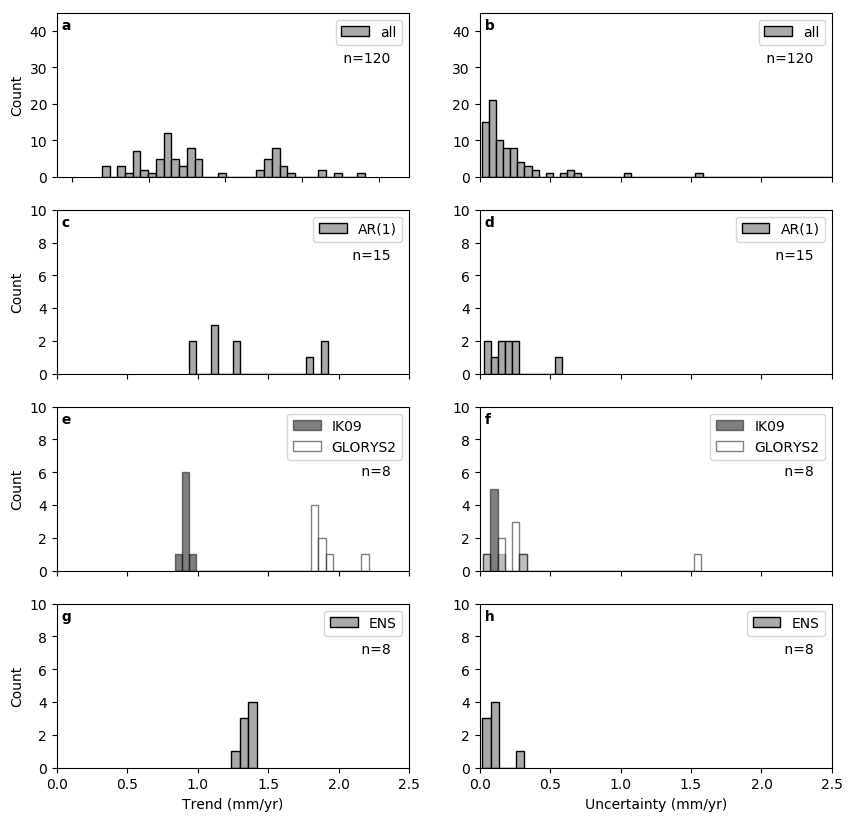

In [6]:
#ds=xr.open_dataset('~/Desktop/paper1/steric/data/trends/1993-2017/alldatasets_13_trends_global.nc')
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_1993-2017.nc')
ds
nm=np.array(ds.nm)
name=np.array(ds.fname)

aic=np.array(ds.aic)
bic=np.array(ds.bic)
tr=np.array(ds.trend)
tr_err=np.array(ds.unc)
#%%
##################
bw=0.05 # bin width
bn = 25 # bin number
xmin=0;xmax=2.5
ymin=0;ymax=45
j=10

#%%
fig=plt.figure(figsize=(10,10),dpi=100)
ax=plt.subplot(4,2,1)
x=np.hstack(tr[:,0:10])
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['all'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )

plt.ylabel('Count')#;plt.grid(True)
plt.xlim(0.4, 2.7)
plt.ylim(ymin,ymax)
ax.text(.0,.9,' a ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=120 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)
ax.xaxis.set_ticklabels([])
#%%
##########
ax=plt.subplot(4,2,2)
x=np.hstack(tr_err[:,0:10])
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['all'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )

plt.ylabel('')#;plt.grid(True)

ax.text(.0,.9,' b ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=120 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
ax.xaxis.set_ticklabels([])
#%%
#########
ymax=10
ax=plt.subplot(4,2,3)
plt.ylabel('Count')#;plt.grid(True)
i=np.array(np.where(nm=='AR1'))
x=tr[i[0,0],0:10] # AR1
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['AR(1)'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )

plt.ylabel('Count')#;plt.grid(True)
ax.text(.0,.9,' c ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=15 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
ax.xaxis.set_ticklabels([])

#%%
###################
ax=plt.subplot(4,2,4)
x=tr_err[i[0,0],0:10] # AR1
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['AR(1)'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )

plt.ylabel('')#;plt.grid(True)

ax.text(.0,.9,' d ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=15 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
ax.xaxis.set_ticklabels([])

#%%
#########################
ax=plt.subplot(4,2,5)

x=tr[:,7]
df=pd.DataFrame(x,columns=['IK09'])
x=tr[:,6]
df['GLORYS2']=x
rg=np.nanmax(df)-np.nanmin(df)

df.plot.hist(ax=ax, bins=int(rg/bw),
#             legend=False,
             edgecolor='black',color=('black','white'),alpha=0.5
             )

#bars = ax.patches
#hatches = ''.join(h*len(df) for h in ' ...')

#for bar, hatch in zip(bars, hatches):
#    bar.set_hatch(hatch)

#ax.legend(loc='center right', 
#          bbox_to_anchor=(1, 0.9), 
#          ncol=1)
ax.text(.0,.9,' e ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.58,' n=8 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.ylabel('Count')#;plt.grid(True)


plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
ax.xaxis.set_ticklabels([])
#%%
###################
ax=plt.subplot(4,2,6)

x=tr_err[:,7]
df=pd.DataFrame(x,columns=['IK09'])
x=tr_err[:,6]
df['GLORYS2']=x
rg=np.nanmax(df)-np.nanmin(df)

df.plot.hist(ax=ax, bins=int(rg/bw),
#             legend=False,
             edgecolor='black',color=('black','white'),alpha=0.5
             )

#bars = ax.patches
#hatches = ''.join(h*len(df) for h in ' ...')

#for bar, hatch in zip(bars, hatches):
#    bar.set_hatch(hatch)

#ax.legend(loc='center right', 
#          bbox_to_anchor=(1, 0.9), 
#          ncol=1)
plt.legend(loc='top right')
ax.text(.0,.9,' f ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.58,' n=8 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.ylabel('')#;plt.grid(True)


plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
ax.xaxis.set_ticklabels([])
#%%
#####################
ax=plt.subplot(4,2,7)

plt.ylabel('Count')#;plt.grid(True)
x=tr[:,12] # ENS
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['ENS'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )

ax.text(.0,.9,' g ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=8 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)
plt.xlabel('Trend (mm/yr)')
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.ylabel('Count')#;plt.grid(True)
#%%
##################
ax=plt.subplot(4,2,8)

x=tr_err[:,12] # ENS
rg=np.nanmax(x)-np.nanmin(x)
df=pd.DataFrame(x,columns=['ENS'])
df.plot.hist(ax=ax,bins=int(rg/bw),
             edgecolor='black',facecolor='darkgrey',
            )
ax.text(.0,.9,' h ',weight='bold',
        horizontalalignment='left',
        transform=ax.transAxes)
ax.text(.96,.7,' n=8 ',#weight='bold',
        horizontalalignment='right',
        transform=ax.transAxes)

plt.xlabel('Uncertainty (mm/yr)')
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.ylabel('')#;plt.grid(True)

plt.show()


fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/SI-3_histogram_1993_bw_grid.pdf',
            format='pdf',dpi=200,bbox_inches='tight')


fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/SI-3_histogram_1993_bw_grid.png',
            format='png',dpi=200,bbox_inches='tight')

Figure S3. 

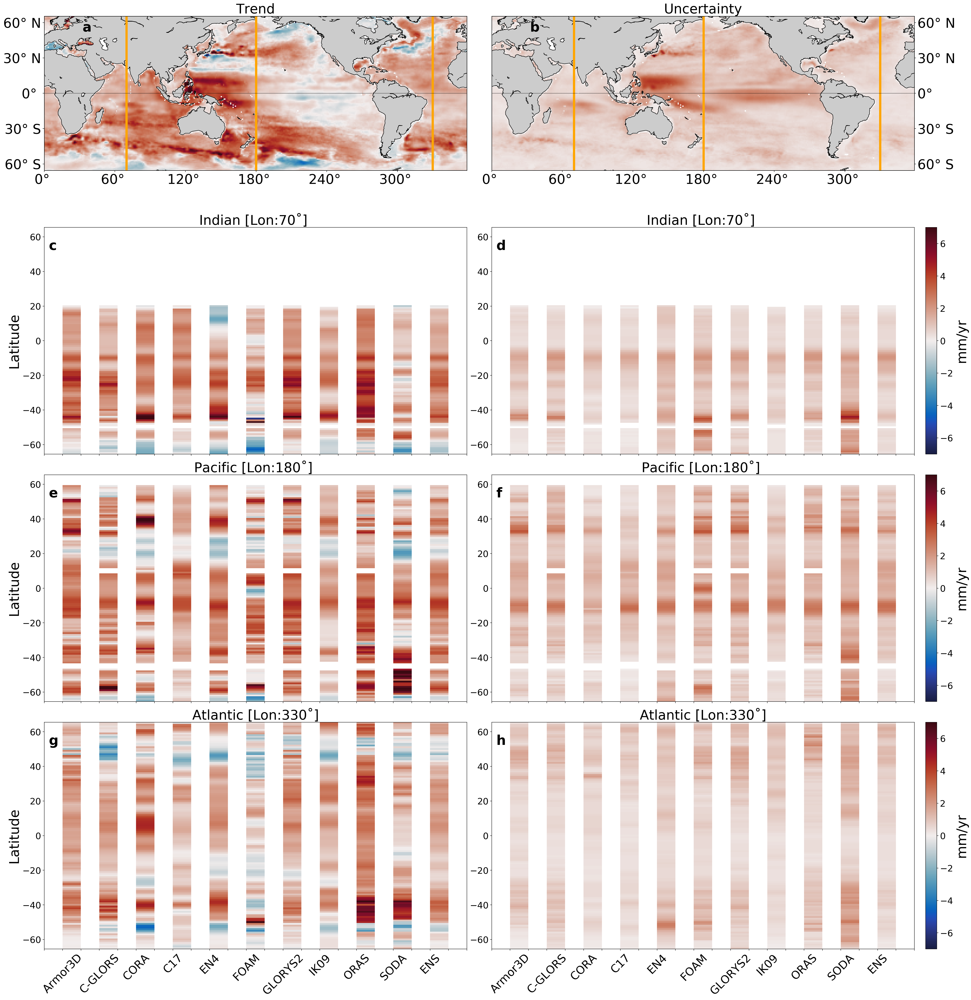

In [23]:
#%%

ds2=xr.open_dataset('~/Desktop/paper1/topo/landmask_nan1_360x132.nc')
ds2
lat=np.array(ds2.lat)
lon=np.array(ds2.lon)
mask=np.array(ds2.mask)

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_1993-2017.nc')

ds
ds=ds.where(ds.fname!='MiS',drop=True)
ds=ds.where(ds.fname!='REA',drop=True)
#ax = plt.subplot(111, projection=ccrs.Mercator())
#mm = ax.pcolor(lon,lat, mask,vmin=0, vmax=1,transform=ccrs.Mercator(),cmap=cmo.balance )
#plt.show()
nm=np.array(ds.nm)
name=np.array(ds.fname)
name[6]='GLORYS2'
name[1]='C-GLORS'
i=3
nm[i]
trend=np.array(ds.trend[:,i,:,:]) # AR1
trend=mask*trend
unc=np.array(ds.unc[:,i,:,:])
unc=unc*mask


# get ENS AR(1) for map:
j=10
trendmap=np.array(trend[j,:,:])
uncmap=np.array(unc[j,:,:])

# Create 'empty' columns for plotting:
k=len(name)*2
x=np.zeros((k+2,len(lat),len(lon)))
x.fill('nan')
y=np.arange(1,k,2)
for i,j in enumerate(y):
    x[j,:,:]=trend[i,:,:]

x2=np.zeros((k+2,len(lat),len(lon)))
x2.fill('nan')
y=np.arange(1,k,2)
for i,j in enumerate(y):
    x2[j,:,:]=unc[i,:,:]


ind=np.arange(0,k+2)


lb=([None])*(k+2)
j=0
for i in range(k):
    if i % 2 == 0:
        lb[i]=''
    else:
        lb[i]=name[j]
        j=j+1
lb[k]=''
lb[k+1]=''


#%%
fig=plt.figure(figsize=(35,40),dpi=200)
gs = GridSpec(8, 6, figure=fig)

# trend map

ax = plt.subplot(gs.new_subplotspec((0, 0), colspan=3,rowspan=2))
data=trendmap

m=Basemap(projection='cyl',
              llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
               llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
                resolution='c')   
    
m.pcolormesh(lon,lat,data,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
    
    
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()

m.drawparallels([0])
#m.drawmeridians([180])

#deg=np.arange(0,360,60)
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
lblon=lblon
ax.set_xticks(deg)
ax.set_xticklabels(lblon,fontsize=30)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
lblat=lblat
ax.set_yticks(deg)
ax.set_yticklabels(lblat,fontsize=30)

# Draw lines:
df = pd.DataFrame({"lon1" : [70,180,330],
                   "lat1" : [lat[0],lat[0],lat[0]],
                   "lon2" : [70,180,330],
                   "lat2" : [lat[-1],lat[-1],lat[-1]]
                  })
lon1, lat1 = m(df.lon1.values, df.lat1.values)
lon2, lat2 = m(df.lon2.values, df.lat2.values)

pts = np.c_[lon1, lat1, lon2, lat2].reshape(len(lon1), 2, 2)
plt.gca().add_collection(LineCollection(pts, color="orange", label="Lines",linewidth=5))
ax.text(0.08,0.9,' a ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax.transAxes)
plt.title('Trend',fontsize=30)


# Unc map
ax = plt.subplot(gs.new_subplotspec((0, 3), colspan=3,rowspan=2))
data=uncmap

m=Basemap(projection='cyl',
              llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
               llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
                resolution='c')   
    
m.pcolormesh(lon,lat,data,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
    
    
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()

m.drawparallels([0])
#m.drawmeridians([180])


deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
lblon=lblon
ax.set_xticks(deg)
ax.set_xticklabels(lblon,fontsize=30)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
lblat=lblat
ax.yaxis.set_label_position("right")
ax.yaxis.tick_right()
ax.set_yticks(deg)
ax.set_yticklabels(lblat,fontsize=30)

# Draw lines:
df = pd.DataFrame({"lon1" : [70,180,330],
                   "lat1" : [lat[0],lat[0],lat[0]],
                   "lon2" : [70,180,330],
                   "lat2" : [lat[-1],lat[-1],lat[-1]]
                  })
lon1, lat1 = m(df.lon1.values, df.lat1.values)
lon2, lat2 = m(df.lon2.values, df.lat2.values)

pts = np.c_[lon1, lat1, lon2, lat2].reshape(len(lon1), 2, 2)
plt.gca().add_collection(LineCollection(pts, color="orange", label="Lines",linewidth=5))
ax.text(0.08,0.9,' b ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax.transAxes)
plt.title('Uncertainty',fontsize=30)



#Transects
# Indian
#trend
ax1 = plt.subplot(gs.new_subplotspec((2, 0),colspan=3,rowspan=2))
data=np.array(x[:,:,70])
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
plt.title('\nIndian [Lon:70˚] ',fontsize=30)
plt.xticks(ind,'',rotation=30)
ax1.text(0,0.9,' c ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Pacific
#trend
ax1 = plt.subplot(gs.new_subplotspec((4, 0),colspan=3,rowspan=2))
data=x[:,:,170]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.title('\nPacific [Lon:180˚] ',fontsize=30)
#plt.title('Trend')
plt.xticks(ind,'',rotation=30)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' e ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Atlantic
#trend
ax1 = plt.subplot(gs.new_subplotspec((6, 0),colspan=3,rowspan=2))
data=x[:,:,330]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.title('\nAtlantic [Lon:330˚]',fontsize=30)
#plt.title('Trend')
plt.xticks(ind,lb,rotation=45,fontsize=25)
plt.ylabel('Latitude', fontsize=30)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' g ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)


# Indian
#Uncertainty
ax1 = plt.subplot(gs.new_subplotspec((2, 3),colspan=3,rowspan=2))
data=x2[:,:,70]
data_t=data.transpose()
im=plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Uncertainty (mm/yr)',fontsize=12)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
plt.title('\nIndian [Lon:70˚] ',fontsize=30)
plt.xticks(ind,'',rotation=30)
ax1.text(0,0.9,' d ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Pacific
#Uncertainty
ax2 = plt.subplot(gs.new_subplotspec((4, 3),colspan=3,rowspan=2))
data=x2[:,:,170]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Uncertainty (mm/yr)',fontsize=12)
plt.title('\nPacific [Lon:180˚] ',fontsize=30)
#plt.title('Uncertainty')
plt.xticks(ind,'',rotation=30)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
ax2.text(0,0.9,' f ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax2.transAxes)


# Atlantic
#Uncertainty
ax3 = plt.subplot(gs.new_subplotspec((6, 3),colspan=3,rowspan=2))
data=x2[:,:,330]
data_t=data.transpose()
im=plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
plt.title('\nAtlantic [Lon:330˚]',fontsize=30)
#plt.title('Uncertainty')
plt.xticks(ind,lb,rotation=45,fontsize=25)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
ax3.text(0,0.9,' h ',weight='bold',fontsize=30,
        horizontalalignment='left',
        transform=ax3.transAxes)

#fig.tight_layout()

cax = fig.add_axes([ax1.get_position().x1+0.01,ax1.get_position().y0,
                    0.01, # width
                    ax1.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

cax = fig.add_axes([ax2.get_position().x1+0.01,ax2.get_position().y0,
                    0.01, # width
                    ax2.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

cax = fig.add_axes([ax3.get_position().x1+0.01,ax3.get_position().y0,
                    0.01, # width
                    ax3.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=30)
cbar.ax.tick_params(labelsize=20)

plt.show()



fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/SI-4_datasets_AR1_1993.png',
            format='png',dpi=200,bbox_inches='tight')
fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/SI-4_datasets_AR1_1993.pdf',
            format='pdf',dpi=200,bbox_inches='tight')

Figure S4. 

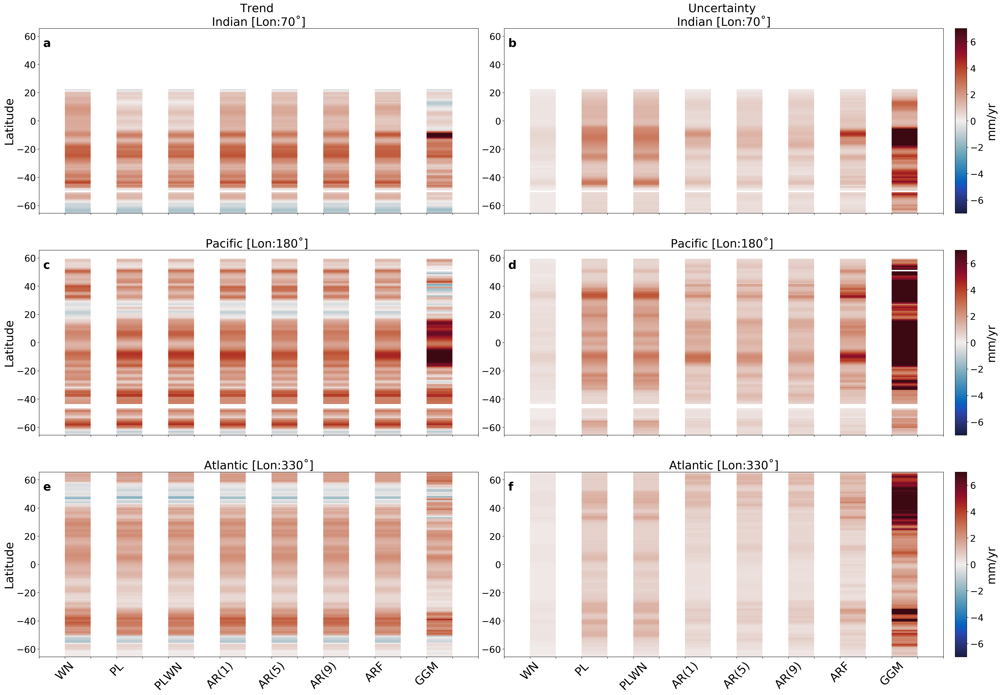

In [24]:
# transformed in text while 1993-2017 is still computing
#to go back to python cel: y+y
ds2=xr.open_dataset('~/Desktop/paper1/steric/data/pub/landmask_etopo1_360x132.nc')
ds2
lat=np.array(ds2.lat)
lon=np.array(ds2.lon)
mask=np.array(ds2.mask)

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_1993-2017.nc')


#ax = plt.subplot(111, projection=ccrs.Mercator())
#mm = ax.pcolor(lon,lat, mask,vmin=0, vmax=1,transform=ccrs.Mercator(),cmap=cmo.balance )
#plt.show()
nm=np.array(ds.nm)
name=np.array(ds.fname)
i=12 # Ensemble
name[i]
trend=np.array(ds.trend[i,:,:,:]) # AR1
trend=mask*trend
unc=np.array(ds.unc[i,:,:,:])
unc=unc*mask


# Create 'empty' columns for plotting:
k=len(nm)*2
x=np.zeros((k+2,len(lat),len(lon)))
x.fill('nan')
y=np.arange(1,k,2)
for i,j in enumerate(y):
    x[j,:,:]=trend[i,:,:]

x2=np.zeros((k+2,len(lat),len(lon)))
x2.fill('nan')
y=np.arange(1,k,2)
for i,j in enumerate(y):
    x2[j,:,:]=unc[i,:,:]


ind=np.arange(0,k+2)

#%%
lb=([None])*(k+2)
j=0
for i in range(k):
    if i % 2 == 0:
        lb[i]=''
    else:
        lb[i]=nm[j]
        j=j+1
lb[k]=''
lb[k+1]=''


#%%
fig=plt.figure(figsize=(35,25),dpi=200)
gs = GridSpec(3, 6, figure=fig)

# Indian
#trend
ax1 = plt.subplot(gs.new_subplotspec((0, 0),colspan=3))
data=np.array(x[:,:,69])
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.ylabel('Latitude', fontsize=25)
plt.yticks(fontsize=20)
plt.title('Trend \n Indian [Lon:70˚] ',fontsize=25)
plt.xticks(ind,'',rotation=30)
ax1.text(0,0.9,' a ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Pacific
#trend
ax1 = plt.subplot(gs.new_subplotspec((1, 0),colspan=3))
data=x[:,:,170]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.title('Pacific [Lon:180˚] ',fontsize=25)
#plt.title('Trend')
plt.xticks(ind,'',rotation=30)
plt.ylabel('Latitude', fontsize=25)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' c ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Atlantic
#trend
ax1 = plt.subplot(gs.new_subplotspec((2, 0),colspan=3))
data=x[:,:,330]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Trend (mm/yr)',fontsize=12)
plt.title('Atlantic [Lon:330˚]',fontsize=25)
#plt.title('Trend')
plt.xticks(ind,lb,rotation=45,fontsize=25)
plt.ylabel('Latitude', fontsize=25)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' e ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Indian
#Uncertainty
ax1 = plt.subplot(gs.new_subplotspec((0, 3),colspan=3))
data=x2[:,:,69]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Uncertainty (mm/yr)',fontsize=12)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
plt.title('Uncertainty \n Indian [Lon:70˚] ',fontsize=25)
plt.xticks(ind,'',rotation=30)
ax1.text(0,0.9,' b ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)
cax = fig.add_axes([ax1.get_position().x1+0.01,ax1.get_position().y0,
                    0.01, # width
                    ax1.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=25)
cbar.ax.tick_params(labelsize=20)

# Pacific
#Uncertainty
ax1 = plt.subplot(gs.new_subplotspec((1, 3),colspan=3))
data=x2[:,:,170]
data_t=data.transpose()
plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
#cbar.set_label(label='Uncertainty (mm/yr)',fontsize=12)
plt.title('Pacific [Lon:180˚] ',fontsize=25)
#plt.title('Uncertainty')
plt.xticks(ind,'',rotation=30)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' d ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)
cax = fig.add_axes([ax1.get_position().x1+0.01,ax1.get_position().y0,
                    0.01, # width
                    ax1.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=25)
cbar.ax.tick_params(labelsize=20)

# Atlantic
#Uncertainty
ax1 = plt.subplot(gs.new_subplotspec((2, 3),colspan=3))
data=x2[:,:,330]
data_t=data.transpose()
im=plt.pcolormesh(ind,lat,data_t,shading='flat',cmap=cm.cm.balance)
plt.clim(-7,7)
#cbar=plt.colorbar(label='mm/yr')
plt.title('Atlantic [Lon:330˚]',fontsize=25)
#plt.title('Uncertainty')
plt.xticks(ind,lb,rotation=45,fontsize=25)
#plt.ylabel('Latitude', fontsize=15)
plt.yticks(fontsize=20)
ax1.text(0,0.9,' f ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)
cax = fig.add_axes([ax1.get_position().x1+0.01,ax1.get_position().y0,
                    0.01, # width
                    ax1.get_position().height])
cbar=plt.colorbar(im, cax=cax) # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=25)
cbar.ax.tick_params(labelsize=20)

plt.show()



fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/SI-5_regionaldist_ENS_nm_1993.pdf',
            format='pdf',dpi=200,bbox_inches='tight')

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/SI-5_regionaldist_ENS_nm_1993.png',
            format='png',dpi=200,bbox_inches='tight')


Figure S5

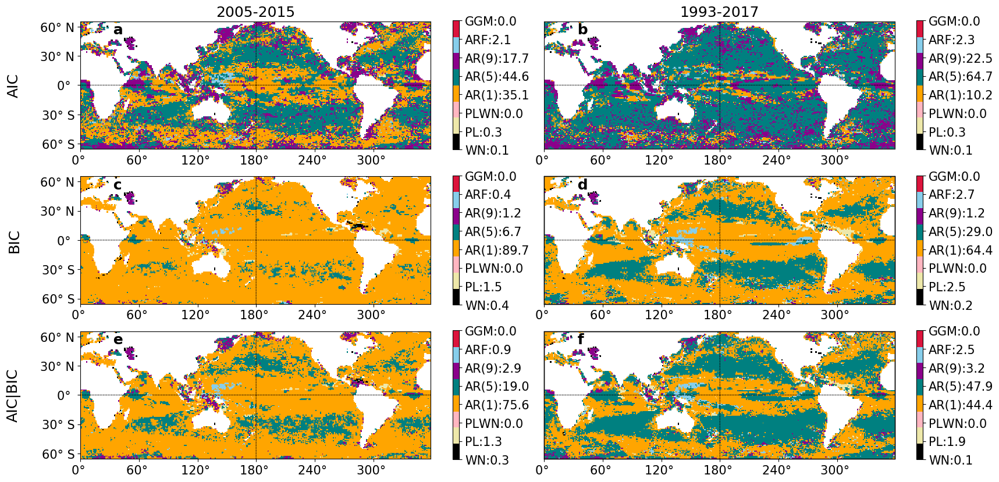

In [25]:
ds2=xr.open_dataset('~/Desktop/paper1/steric/data/pub/landmask_etopo1_360x132.nc')
ds2
lat=np.array(ds2.lat)
lon=np.array(ds2.lon)
mask=np.array(ds2.mask)

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_2005-2015.nc')
ds
j=18
nm=np.array(ds.nm)
name=np.array(ds.fname[0:j])

aic=np.array(ds.aic[0:j,:,:,:])
bic=np.array(ds.bic[0:j,:,:,:])
aicbic=np.nanmean([aic,bic],axis=0)

#%%
aic=aic*mask
bic=bic*mask
aicbic=aicbic*mask

#%%
rkb=np.zeros((len(lat),len(lon)))
rkb[:,:]='nan'
rka=np.zeros((len(lat),len(lon)))
rka[:,:]='nan'
rk=np.zeros((len(lat),len(lon)))
rk[:,:]='nan'

ilat=ilon=j=5
for ilat,l in enumerate(lat):
    for ilon,l in enumerate(lon):
        
        if ~np.isnan(mask[ilat,ilon]):
            targeta=aic[:,:,ilat,ilon] # All datasets and noise-models for this lat and lon
            targetb=bic[:,:,ilat,ilon]       
            targetab=aicbic[:,:,ilat,ilon]
            
            bic2=np.zeros((len(name),len(nm)))
            aic2=np.zeros((len(name),len(nm)))
            aicbic2=np.zeros((len(name),len(nm)))
    
            for iname in np.arange(0,len(name)):
                
##                AIC
                tg=targeta[iname,:] # all noise models for this dataset
                logaic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logaic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logaic 
                indaic=np.where(logaic>0.5)
                indaic=np.array(indaic)
                for inm in np.arange(0,len(nm)):
                    for ind in indaic:
                        for ind2 in ind:
                            if inm==ind2:        
                                aic2[iname,inm]=1
#                
                
                #BIC
                tg=targetb[iname,:]
                tg
                logbic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logbic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logbic 
                indbic=np.where(logbic>0.5)
                indbic=np.array(indbic)
                indbic
                for inm in np.arange(0,len(nm)):
                    for ind in indbic:
                        for ind2 in ind:
                            if inm==ind2:        
                                bic2[iname,inm]=1
#                AIC|BIC
                tg=targetab[iname,:]
                tg
                logab=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logab[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logab 
                indab=np.where(logab>0.5)
                indab=np.array(indab)
                indab
                for inm in np.arange(0,len(nm)):
                    for ind in indab:
                        for ind2 in ind:
                            if inm==ind2:        
                                aicbic2[iname,inm]=1
                                
            
            indaic=np.sum(aic2,axis=0)                   
            tmp=np.array(np.where(indaic==np.nanmax(indaic)))
            rka[ilat,ilon]=tmp[0,0]

            indbic=np.sum(bic2,axis=0)
            tmp=np.array(np.where(indbic==np.nanmax(indbic)))
            rkb[ilat,ilon]=tmp[0,0]

            indab=np.sum(aicbic2,axis=0)
            tmp=np.array(np.where(indab==np.nanmax(indab)))
            rk[ilat,ilon]=tmp[0,0]

            
rka05=np.array(rka)
rkb05=np.array(rkb)
rk05=np.array(rk)

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_1993-2017.nc')
ds
j=12
nm=np.array(ds.nm)
name=np.array(ds.fname[0:j])

aic=np.array(ds.aic[0:j,:,:,:])
bic=np.array(ds.bic[0:j,:,:,:])
aicbic=np.nanmean([aic,bic],axis=0)

#%%
aic=aic*mask
bic=bic*mask
aicbic=aicbic*mask

#%%
rkb=np.zeros((len(lat),len(lon)))
rkb[:,:]='nan'
rka=np.zeros((len(lat),len(lon)))
rka[:,:]='nan'
rk=np.zeros((len(lat),len(lon)))
rk[:,:]='nan'

ilat=ilon=j=5
for ilat,l in enumerate(lat):
    for ilon,l in enumerate(lon):
        
        if ~np.isnan(mask[ilat,ilon]):
            targeta=aic[:,:,ilat,ilon] # All datasets and noise-models for this lat and lon
            targetb=bic[:,:,ilat,ilon]       
            targetab=aicbic[:,:,ilat,ilon]
            
            bic2=np.zeros((len(name),len(nm)))
            aic2=np.zeros((len(name),len(nm)))
            aicbic2=np.zeros((len(name),len(nm)))
    
            for iname in np.arange(0,len(name)):
                
##                AIC
                tg=targeta[iname,:] # all noise models for this dataset
                logaic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logaic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logaic 
                indaic=np.where(logaic>0.5)
                indaic=np.array(indaic)
                for inm in np.arange(0,len(nm)):
                    for ind in indaic:
                        for ind2 in ind:
                            if inm==ind2:        
                                aic2[iname,inm]=1
#                
                
                #BIC
                tg=targetb[iname,:]
                tg
                logbic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logbic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logbic 
                indbic=np.where(logbic>0.5)
                indbic=np.array(indbic)
                indbic
                for inm in np.arange(0,len(nm)):
                    for ind in indbic:
                        for ind2 in ind:
                            if inm==ind2:        
                                bic2[iname,inm]=1
#                AIC|BIC
                tg=targetab[iname,:]
                tg
                logab=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logab[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logab 
                indab=np.where(logab>0.5)
                indab=np.array(indab)
                indab
                for inm in np.arange(0,len(nm)):
                    for ind in indab:
                        for ind2 in ind:
                            if inm==ind2:        
                                aicbic2[iname,inm]=1
                                
            
            indaic=np.sum(aic2,axis=0)                   
            tmp=np.array(np.where(indaic==np.nanmax(indaic)))
            rka[ilat,ilon]=tmp[0,0]

            indbic=np.sum(bic2,axis=0)
            tmp=np.array(np.where(indbic==np.nanmax(indbic)))
            rkb[ilat,ilon]=tmp[0,0]

            indab=np.sum(aicbic2,axis=0)
            tmp=np.array(np.where(indab==np.nanmax(indab)))
            rk[ilat,ilon]=tmp[0,0]

            
rka93=np.array(rka)
rkb93=np.array(rkb)
rk93=np.array(rk)

# Compute % of grid cells and % ocean area for each noise model, according to each selection criterea and time period

data=rka05

perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df=pd.DataFrame(rel_area,columns=['aic_area05'])
df['aic_grid05']=perc

#%%
data=rkb05
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['bic_area05']=rel_area
df['bic_grid05']=perc

#%%
data=rk05
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['aicbic_area05']=rel_area
df['aicbic_grid05']=perc

#%%
data=rka93

perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['aic_area93']=rel_area
df['aic_grid93']=perc

#%%
data=rkb93
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['bic_area93']=rel_area
df['bic_grid93']=perc

#%%
data=rk93
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['aicbic_area93']=rel_area
df['aicbic_grid93']=perc

df

fig=plt.figure(figsize=(20,10),dpi=100)
gs = GridSpec(3, 6, figure=fig)

cmax=7
cmin=0
cmap=plt.cm.get_cmap('Set3', cmax+1)

# AIC
ax1 = plt.subplot(gs.new_subplotspec((0, 0),colspan=3))
data=rka05

perc=np.array(df.aic_area05)

lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )



m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
plt.title('2005-2015',fontsize=18)

ax1.text(0.08,0.90,' a ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)
plt.ylabel('AIC\n',fontsize=18)


#%
#########################
# BIC
ax1 = plt.subplot(gs.new_subplotspec((1, 0),colspan=3))

data=rkb05
perc=np.array(df.bic_area05)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )
    

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
plt.ylabel('BIC\n',fontsize=18)
ax1.text(0.08,0.90,' c ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)
#plt.ylabel('Latitude\n',fontsize=15)


####################
# AIC|BIC
ax1 = plt.subplot(gs.new_subplotspec((2, 0),colspan=3))

data=rk05
perc=np.array(df.aicbic_area05)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )
    


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
plt.ylabel('AIC|BIC\n',fontsize=18)
ax1.text(0.08,0.90,' e ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)
#plt.ylabel('Latitude\n',fontsize=15)
#plt.xlabel('\nLongitude',fontsize=15)

##################
#################
# AIC
ax1 = plt.subplot(gs.new_subplotspec((0, 3),colspan=3))
data=rka93

perc=np.array(df.aic_area93)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

#deg=np.arange(-60,61,30)
#lblat=[None]*len(deg)
#for i,d in enumerate(deg): lblat[i]=lat2str(d)
#ax1.set_yticks(deg)
#ax1.set_yticklabels(lblat,fontsize=15)



cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')

cbar.ax.tick_params(labelsize=12)
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbarcbar.ax.set_xticklabels(lb,fontsize=10,rotation=45) # horizontally oriented colorbar
plt.title('1993-2017',fontsize=18)

ax1.text(0.08,0.90,' b ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)

#%
#########################
# BIC
ax1 = plt.subplot(gs.new_subplotspec((1, 3),colspan=3))

data=rkb93
perc=np.array(df.bic_area93)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

#deg=np.arange(-60,61,30)
#lblat=[None]*len(deg)
#for i,d in enumerate(deg): lblat[i]=lat2str(d)
#ax1.set_yticks(deg)
#ax1.set_yticklabels(lblat,fontsize=15)



m.drawmapboundary()


cbar=plt.colorbar(cax,ticks=range(len(nm)), 
                  #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
#plt.title('BIC',fontsize=18)
ax1.text(0.08,0.90,' d ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)

####################
# AIC|BIC
ax1 = plt.subplot(gs.new_subplotspec((2, 3),colspan=3))

data=rk93
perc=np.array(df.aicbic_area93)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )
    


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

#deg=np.arange(-60,61,30)
#lblat=[None]*len(deg)
#for i,d in enumerate(deg): lblat[i]=lat2str(d)
#ax1.set_yticks(deg)
#ax1.set_yticklabels(lblat,fontsize=15)


m.drawmapboundary()

##plt.xlabel('\nLongitude',fontsize=15)
cbar=plt.colorbar(cax,ticks=range(len(nm)), 
                  ##shrink=0.95,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
#plt.title('AIC|BIC',fontsize=18)
ax1.text(0.08,0.90,' f ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)



plt.show()



fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/SI-6_NM_scores_All_datasets.pdf',
            format='pdf',dpi=200,bbox_inches='tight')

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/SI-6_NM_scores_All_datasets.png',
            format='png',dpi=200,bbox_inches='tight')


Figure S6

In [26]:
ds2=xr.open_dataset('~/Desktop/paper1/steric/data/pub/landmask_etopo1_360x132.nc')
ds2
lat=np.array(ds2.lat)
lon=np.array(ds2.lon)
mask=np.array(ds2.mask)

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_2005-2015.nc')
ds

nm=np.array(ds.nm)
name=np.array(ds.fname)
i=11
name[i]

'ISAS+'

In [27]:


name=name[i]
trend=np.array(ds.trend[i,:,:,:]) # AR1
trend=mask*trend
unc=np.array(ds.unc[i,:,:,:])
unc=unc*mask
aic=np.array(ds.aic[i,:,:,:])
bic=np.array(ds.bic[i,:,:,:])
aicbic=np.nanmean([aic,bic],axis=0)

#%%
aic=aic*mask
bic=bic*mask
aicbic=aicbic*mask
#%%
rkb=np.zeros((len(lat),len(lon)))
rkb[:,:]='nan'
rka=np.zeros((len(lat),len(lon)))
rka[:,:]='nan'
rk=np.zeros((len(lat),len(lon)))
rk[:,:]='nan'


ilat=ilon=j=5
for ilat,l in enumerate(lat):
    for ilon,l in enumerate(lon):
        
        if ~np.isnan(mask[ilat,ilon]):
            targeta=aic[:,ilat,ilon] # All datasets and noise-models for this lat and lon
            targetb=bic[:,ilat,ilon]       
            target=aicbic[:,ilat,ilon]
            
            bic2=np.zeros((len(name),len(nm)))
            aic2=np.zeros((len(name),len(nm)))
            aicbic2=np.zeros((len(name),len(nm)))
    
            for iname in np.arange(0,len(name)):
                
##                AIC
                tg=targeta[:] # all noise models for this dataset
                logaic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logaic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logaic 
                indaic=np.where(logaic>0.5)
                indaic=np.array(indaic)
                for inm in np.arange(0,len(nm)):
                    for ind in indaic:
                        for ind2 in ind:
                            if inm==ind2:        
                                aic2[iname,inm]=1
#                
                
                #BIC
                tg=targetb[:]
                tg
                logbic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logbic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logbic 
                indbic=np.where(logbic>0.5)
                indbic=np.array(indbic)
                indbic
                for inm in np.arange(0,len(nm)):
                    for ind in indbic:
                        for ind2 in ind:
                            if inm==ind2:        
                                bic2[iname,inm]=1
                #AIC|BIC
                tg=target[:]
                tg
                logab=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logab[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logab 
                indab=np.where(logab>0.5)
                indab=np.array(indab)
                indab
                for inm in np.arange(0,len(nm)):
                    for ind in indab:
                        for ind2 in ind:
                            if inm==ind2:        
                                aicbic2[iname,inm]=1
                                
            
            indaic=np.sum(aic2,axis=0)                   
            tmp=np.array(np.where(indaic==np.nanmax(indaic)))
            rka[ilat,ilon]=tmp[0,0]
            
            indbic=np.sum(bic2,axis=0)
            tmp=np.array(np.where(indbic==np.nanmax(indbic)))
            rkb[ilat,ilon]=tmp[0,0]

            indab=np.sum(aicbic2,axis=0)
            tmp=np.array(np.where(indab==np.nanmax(indab)))
            rk[ilat,ilon]=tmp[0,0]


            
rka05=np.array(rka)
rkb05=np.array(rkb)
rk05=np.array(rk)
trend05=np.array(trend)
unc05=np.array(unc)



In [28]:
#%%
#1993-2017

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_1993-2017.nc')
ds

nm=np.array(ds.nm)
name=np.array(ds.fname)
i=1 # ensemble mean
name[i]

'CGLORS'

In [29]:
name=name[i]
trend=np.array(ds.trend[i,:,:,:]) # AR1
trend=mask*trend
unc=np.array(ds.unc[i,:,:,:])
unc=unc*mask
aic=np.array(ds.aic[i,:,:,:])
bic=np.array(ds.bic[i,:,:,:])
aicbic=np.nanmean([aic,bic],axis=0)

#%%
aic=aic*mask
bic=bic*mask
aicbic=aicbic*mask
#%%
rkb=np.zeros((len(lat),len(lon)))
rkb[:,:]='nan'
rka=np.zeros((len(lat),len(lon)))
rka[:,:]='nan'
rk=np.zeros((len(lat),len(lon)))
rk[:,:]='nan'


ilat=ilon=j=5
for ilat,l in enumerate(lat):
    for ilon,l in enumerate(lon):
        
        if ~np.isnan(mask[ilat,ilon]):
            targeta=aic[:,ilat,ilon] # All datasets and noise-models for this lat and lon
            targetb=bic[:,ilat,ilon]       
            target=aicbic[:,ilat,ilon]
            
            bic2=np.zeros((len(name),len(nm)))
            aic2=np.zeros((len(name),len(nm)))
            aicbic2=np.zeros((len(name),len(nm)))
    
            for iname in np.arange(0,len(name)):
                
##                AIC
                tg=targeta[:] # all noise models for this dataset
                logaic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logaic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logaic 
                indaic=np.where(logaic>0.5)
                indaic=np.array(indaic)
                for inm in np.arange(0,len(nm)):
                    for ind in indaic:
                        for ind2 in ind:
                            if inm==ind2:        
                                aic2[iname,inm]=1
#                
                
                #BIC
                tg=targetb[:]
                tg
                logbic=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logbic[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logbic 
                indbic=np.where(logbic>0.5)
                indbic=np.array(indbic)
                indbic
                for inm in np.arange(0,len(nm)):
                    for ind in indbic:
                        for ind2 in ind:
                            if inm==ind2:        
                                bic2[iname,inm]=1
                #AIC|BIC
                tg=target[:]
                tg
                logab=np.zeros((tg.shape))
                for inm in np.arange(0,len(nm)):
                    logab[inm]=np.exp((np.nanmin(tg)-tg[inm])/2)
                
                logab 
                indab=np.where(logab>0.5)
                indab=np.array(indab)
                indab
                for inm in np.arange(0,len(nm)):
                    for ind in indab:
                        for ind2 in ind:
                            if inm==ind2:        
                                aicbic2[iname,inm]=1
                                
            
            indaic=np.sum(aic2,axis=0)                   
            tmp=np.array(np.where(indaic==np.nanmax(indaic)))
            rka[ilat,ilon]=tmp[0,0]
            
            indbic=np.sum(bic2,axis=0)
            tmp=np.array(np.where(indbic==np.nanmax(indbic)))
            rkb[ilat,ilon]=tmp[0,0]

            indab=np.sum(aicbic2,axis=0)
            tmp=np.array(np.where(indab==np.nanmax(indab)))
            rk[ilat,ilon]=tmp[0,0]


#%%
rka93=np.array(rka)
rkb93=np.array(rkb)
rk93=np.array(rk)
trend93=np.array(trend)
unc93=np.array(unc)

In [30]:
# Compute % of grid cells and % ocean area for each noise model, according to each selection criterea and time period

data=rka05

perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df=pd.DataFrame(rel_area,columns=['aic_area05'])
df['aic_grid05']=perc

#%%
data=rkb05
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['bic_area05']=rel_area
df['bic_grid05']=perc

#%%
data=rk05
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['aicbic_area05']=rel_area
df['aicbic_grid05']=perc

#%%
data=rka93

perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['aic_area93']=rel_area
df['aic_grid93']=perc

#%%
data=rkb93
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['bic_area93']=rel_area
df['bic_grid93']=perc

#%%
data=rk93
perc=np.zeros((len(nm)))
# count nans:
tmp=list(np.hstack(data))
j=np.array(np.where(np.isnan(tmp)))


for i in range(len(nm)):
   # print(i)
    #print(NM[i])
    tmp=list(np.hstack(data))
    perc[i]=(tmp.count(i)/(len(tmp)-len(j[0,:])))*100
    #print(perc_bic[i])

rel_area=np.zeros((len(nm)))
dry_msk=get_dry_msk(data)
total_area,area=get_ocean_area(lat,lon,dry_msk)
for i in range(len(nm)):
    tmp=np.copy(data)
    tmp[np.where(tmp!=i)]='nan'
    tmp[np.where(np.isnan(tmp)==False)]=1
    tmp[np.where(np.isnan(tmp))]=0
    surf,area=get_ocean_area(lat,lon,tmp)
    rel_area[i]=(surf/total_area)*100

df['aicbic_area93']=rel_area
df['aicbic_grid93']=perc

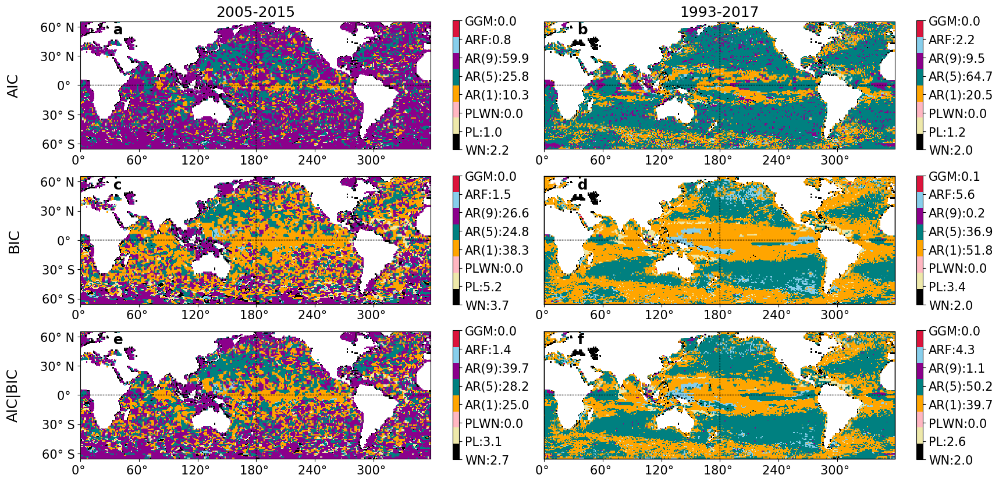

In [31]:
#%% PLOT
fig=plt.figure(figsize=(20,10),dpi=100)
gs = GridSpec(3, 6, figure=fig)

cmax=7
cmin=0
cmap=plt.cm.get_cmap('Set3', cmax+1)

# AIC
ax1 = plt.subplot(gs.new_subplotspec((0, 0),colspan=3))
data=rka05

perc=np.array(df.aic_area05)

lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )



m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
plt.title('2005-2015',fontsize=18)

ax1.text(0.08,0.90,' a ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)
plt.ylabel('AIC\n',fontsize=18)


#%
#########################
# BIC
ax1 = plt.subplot(gs.new_subplotspec((1, 0),colspan=3))

data=rkb05
perc=np.array(df.bic_area05)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )
    

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
plt.ylabel('BIC\n',fontsize=18)
ax1.text(0.08,0.90,' c ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)
#plt.ylabel('Latitude\n',fontsize=15)


####################
# AIC|BIC
ax1 = plt.subplot(gs.new_subplotspec((2, 0),colspan=3))

data=rk05
perc=np.array(df.aicbic_area05)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )
    


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,30)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)

cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
plt.ylabel('AIC|BIC\n',fontsize=18)
ax1.text(0.08,0.90,' e ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)
#plt.ylabel('Latitude\n',fontsize=15)
#plt.xlabel('\nLongitude',fontsize=15)

##################
#################
# AIC
ax1 = plt.subplot(gs.new_subplotspec((0, 3),colspan=3))
data=rka93

perc=np.array(df.aic_area93)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

#deg=np.arange(-60,61,30)
#lblat=[None]*len(deg)
#for i,d in enumerate(deg): lblat[i]=lat2str(d)
#ax1.set_yticks(deg)
#ax1.set_yticklabels(lblat,fontsize=15)



cbar=plt.colorbar(cax,ticks=range(len(nm)), #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')

cbar.ax.tick_params(labelsize=12)
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbarcbar.ax.set_xticklabels(lb,fontsize=10,rotation=45) # horizontally oriented colorbar
plt.title('1993-2017',fontsize=18)

ax1.text(0.08,0.90,' b ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)

#%
#########################
# BIC
ax1 = plt.subplot(gs.new_subplotspec((1, 3),colspan=3))

data=rkb93
perc=np.array(df.bic_area93)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

#deg=np.arange(-60,61,30)
#lblat=[None]*len(deg)
#for i,d in enumerate(deg): lblat[i]=lat2str(d)
#ax1.set_yticks(deg)
#ax1.set_yticklabels(lblat,fontsize=15)



m.drawmapboundary()


cbar=plt.colorbar(cax,ticks=range(len(nm)), 
                  #shrink=0.7,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
#plt.title('BIC',fontsize=18)
ax1.text(0.08,0.90,' d ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)

####################
# AIC|BIC
ax1 = plt.subplot(gs.new_subplotspec((2, 3),colspan=3))

data=rk93
perc=np.array(df.aicbic_area93)
lb=list(nm)
for i in range(len(nm)):
    lb[i]=str(nm[i]+":"+str(np.round(perc[i],1)) )
    


m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmapnm)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

#deg=np.arange(-60,61,30)
#lblat=[None]*len(deg)
#for i,d in enumerate(deg): lblat[i]=lat2str(d)
#ax1.set_yticks(deg)
#ax1.set_yticklabels(lblat,fontsize=15)


m.drawmapboundary()

##plt.xlabel('\nLongitude',fontsize=15)
cbar=plt.colorbar(cax,ticks=range(len(nm)), 
                  ##shrink=0.95,
                  #label='Preferred Noise Model',fontsize=15,
                  orientation='vertical')
cbar.ax.set_yticklabels(lb,fontsize=15) # horizontally oriented colorbar
#plt.title('AIC|BIC',fontsize=18)
ax1.text(0.08,0.90,' f ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)



plt.show()


fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/SI-7_NM_scores_CGlors.pdf',
            format='pdf',dpi=200,bbox_inches='tight')
fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/SI-7_NM_scores_CGlors.png',
            format='png',dpi=200,bbox_inches='tight')


Figure S7

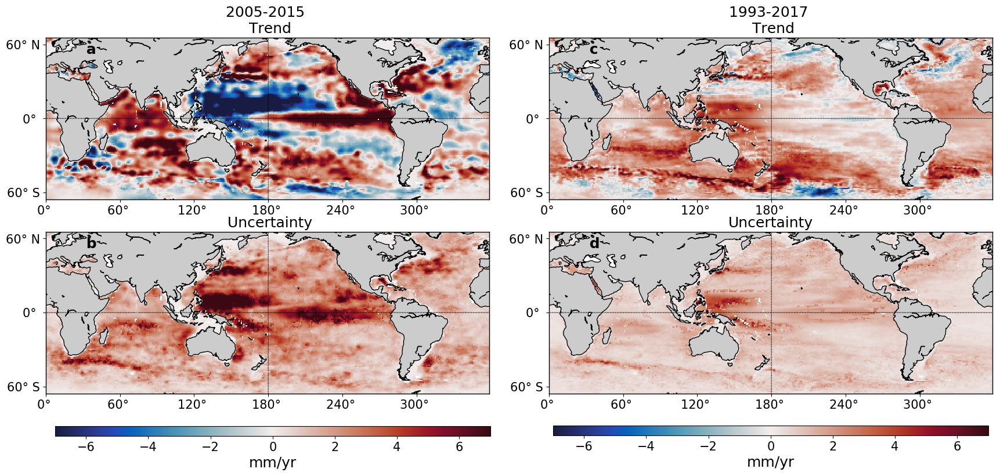

In [32]:

#Figure 8 - needs data from Figure 7!

#2005-2015
trend_aic05=np.zeros((len(lat),len(lon)))
trend_aic05.fill('nan')
trend_bic05=np.zeros((len(lat),len(lon)))
trend_bic05.fill('nan')
trend_aicbic05=np.zeros((len(lat),len(lon)))
trend_aicbic05.fill('nan')

unc_aic05=np.zeros((len(lat),len(lon)))
unc_aic05.fill('nan')
unc_bic05=np.zeros((len(lat),len(lon)))
unc_bic05.fill('nan')
unc_aicbic05=np.zeros((len(lat),len(lon)))
unc_aicbic05.fill('nan')
for ilat,l in enumerate(lat):
    for ilon,l in enumerate(lon):
            ind=np.array(rka05[ilat,ilon])
            if np.isnan(ind):
                trend_aic05[ilat,ilon]='nan'
                unc_aic05[ilat,ilon]='nan'
            else:
                trend_aic05[ilat,ilon]=trend05[int(ind),ilat,ilon]
                unc_aic05[ilat,ilon]=unc05[int(ind),ilat,ilon]
            
            ind=np.array(rkb05[ilat,ilon])
            if np.isnan(ind):
                trend_bic05[ilat,ilon]='nan'
                unc_bic05[ilat,ilon]='nan'
            else:
                trend_bic05[ilat,ilon]=trend05[int(ind),ilat,ilon]
                unc_bic05[ilat,ilon]=unc05[int(ind),ilat,ilon]
            
            ind=np.array(rk05[ilat,ilon])
            if np.isnan(ind):
                trend_aicbic05[ilat,ilon]='nan'
                unc_aicbic05[ilat,ilon]='nan'
            else:
                trend_aicbic05[ilat,ilon]=trend05[int(ind),ilat,ilon]
                unc_aicbic05[ilat,ilon]=unc05[int(ind),ilat,ilon]


#1993-2017
trend_aic93=np.zeros((len(lat),len(lon)))
trend_aic93.fill('nan')
trend_bic93=np.zeros((len(lat),len(lon)))
trend_bic93.fill('nan')
trend_aicbic93=np.zeros((len(lat),len(lon)))
trend_aicbic93.fill('nan')

unc_aic93=np.zeros((len(lat),len(lon)))
unc_aic93.fill('nan')
unc_bic93=np.zeros((len(lat),len(lon)))
unc_bic93.fill('nan')
unc_aicbic93=np.zeros((len(lat),len(lon)))
unc_aicbic93.fill('nan')
for ilat,l in enumerate(lat):
    for ilon,l in enumerate(lon):
            ind=np.array(rka93[ilat,ilon])
            if np.isnan(ind):
                trend_aic93[ilat,ilon]='nan'
                unc_aic93[ilat,ilon]='nan'
            else:
                trend_aic93[ilat,ilon]=trend93[int(ind),ilat,ilon]
                unc_aic93[ilat,ilon]=unc93[int(ind),ilat,ilon]
            
            ind=np.array(rkb93[ilat,ilon])
            if np.isnan(ind):
                trend_bic93[ilat,ilon]='nan'
                unc_bic93[ilat,ilon]='nan'
            else:
                trend_bic93[ilat,ilon]=trend93[int(ind),ilat,ilon]
                unc_bic93[ilat,ilon]=unc93[int(ind),ilat,ilon]
            
            ind=np.array(rk93[ilat,ilon])
            if np.isnan(ind):
                trend_aicbic93[ilat,ilon]='nan'
                unc_aicbic93[ilat,ilon]='nan'
            else:
                trend_aicbic93[ilat,ilon]=trend93[int(ind),ilat,ilon]
                unc_aicbic93[ilat,ilon]=unc93[int(ind),ilat,ilon]

fig, ax = plt.subplots(figsize=(22,17),dpi=100)
#fig.suptitle('Ensemble',fontsize=20)
gs = GridSpec(4,10, figure=fig)

# Trend
ax1 = plt.subplot(gs.new_subplotspec((0, 0),colspan=5))
cmin=-7;cmax=7;cmap=cm.cm.balance
data=trend_aicbic05 
m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()
plt.title('2005-2015 \n Trend',fontsize=18)
m.drawparallels([0])
m.drawmeridians([180])
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=15)
ax1.text(0.08,0.90,' a ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax1.transAxes)

# Uncertainty
ax2 = plt.subplot(gs.new_subplotspec((1, 0),colspan=5))
cmin=-7;cmax=7;cmap=cm.cm.balance
data=unc_aicbic05 
m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()
plt.title(' Uncertainty',fontsize=18)
m.drawparallels([0])
m.drawmeridians([180])
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax2.set_xticks(deg)
ax2.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax2.set_yticks(deg)
ax2.set_yticklabels(lblat,fontsize=15)

ax2.text(0.08,0.90,' b ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax2.transAxes)

# 1993 - 2017

ax3 = plt.subplot(gs.new_subplotspec((0, 5),colspan=5))
cmin=-7;cmax=7;cmap=cm.cm.balance
data=trend_aicbic93 
m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()
plt.title('1993-2017 \n Trend',fontsize=18)
m.drawparallels([0])
m.drawmeridians([180])
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax3.set_xticks(deg)
ax3.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax3.set_yticks(deg)
ax3.set_yticklabels(lblat,fontsize=15)
ax3.text(0.08,0.90,' c ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax3.transAxes)

##
ax4 = plt.subplot(gs.new_subplotspec((1, 5),colspan=5))
cmin=-7;cmax=7;cmap=cm.cm.balance
data=unc_aicbic93 
m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawcoastlines()
m.fillcontinents()
m.drawmapboundary()
m.drawparallels([0])
m.drawmeridians([180])
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax4.set_xticks(deg)
ax4.set_xticklabels(lblon,fontsize=15)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax4.set_yticks(deg)
ax4.set_yticklabels(lblat,fontsize=15)
plt.title('Uncertainty',fontsize=18)

ax4.text(0.08,0.90,' d ',weight='bold',fontsize=18,
        horizontalalignment='left',
        transform=ax4.transAxes)


cax = fig.add_axes([ax4.get_position().y0+0.02, # x position
                    ax4.get_position().x0-0.0425, # y position 
                    ax4.get_position().width-0.04, # width
                    0.01]) # height
cbar=plt.colorbar(cax=cax, orientation='horizontal') # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=18)
cbar.ax.tick_params(labelsize=15)

cax = fig.add_axes([ax2.get_position().y0-0.37, # x position
                    ax2.get_position().x1-0.03, # y position 
                    ax2.get_position().width-0.04, # width
                    0.01]) # height
cbar=plt.colorbar( cax=cax, orientation='horizontal') # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='mm/yr',fontsize=18)
cbar.ax.tick_params(labelsize=15)

plt.show()

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/SI-8_CGlors_preferred_NM.pdf',
            format='pdf',dpi=200,bbox_inches='tight')
fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/SI-8_CGlors_preferred_NM.png',
            format='png',dpi=200,bbox_inches='tight')

Figure S8

In [3]:
i=-1
j=18
n=3

#%%
## 2005-2015
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_2005-2015.nc')
ds
lat=np.array(ds.lat)
lon=np.array(ds.lon)

label=['trend_2005_AR1','unc_2005_AR1','trend_2005_ENS','unc_2005_ENS',
       'trend_1993_AR1','unc_1993_AR1','trend_2005_ENS','unc_2005_ENS']


x=np.zeros((len(label),len(lat),len(lon)))

#AR1 all datasets
data=np.array(ds.trend[:,n,:,:]) 
std=np.nanstd(data,axis=(0))
i=i+1
x[i,:,:]=std

#%
data=np.array(ds.unc[:,n,:,:])
std=np.nanstd(data,axis=(0))
i=i+1
x[i,:,:]=std

#ENS all noise models
data=np.array(ds.trend[j,:,:,:]) 
std=np.nanstd(data,axis=(0))
i=i+1
x[i,:,:]=std

#%
data=np.array(ds.unc[j,:,:,:])
std=np.nanstd(data,axis=(0))
i=i+1
x[i,:,:]=std

#%% 1993-2017
j=12

#%%
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_regional_1993-2017.nc')
ds

#AR1 all datasets
data=np.array(ds.trend[:,n,:,:]) 
std=np.nanstd(data,axis=(0))
i=i+1
x[i,:,:]=std

#%
data=np.array(ds.unc[:,n,:,:])
std=np.nanstd(data,axis=(0))
i=i+1
x[i,:,:]=std

#ENS all noise models
data=np.array(ds.trend[j,:,:,:]) 
std=np.nanstd(data,axis=(0))
i=i+1
x[i,:,:]=std

#%
data=np.array(ds.unc[j,:,:,:])
std=np.nanstd(data,axis=(0))
i=i+1
x[i,:,:]=std


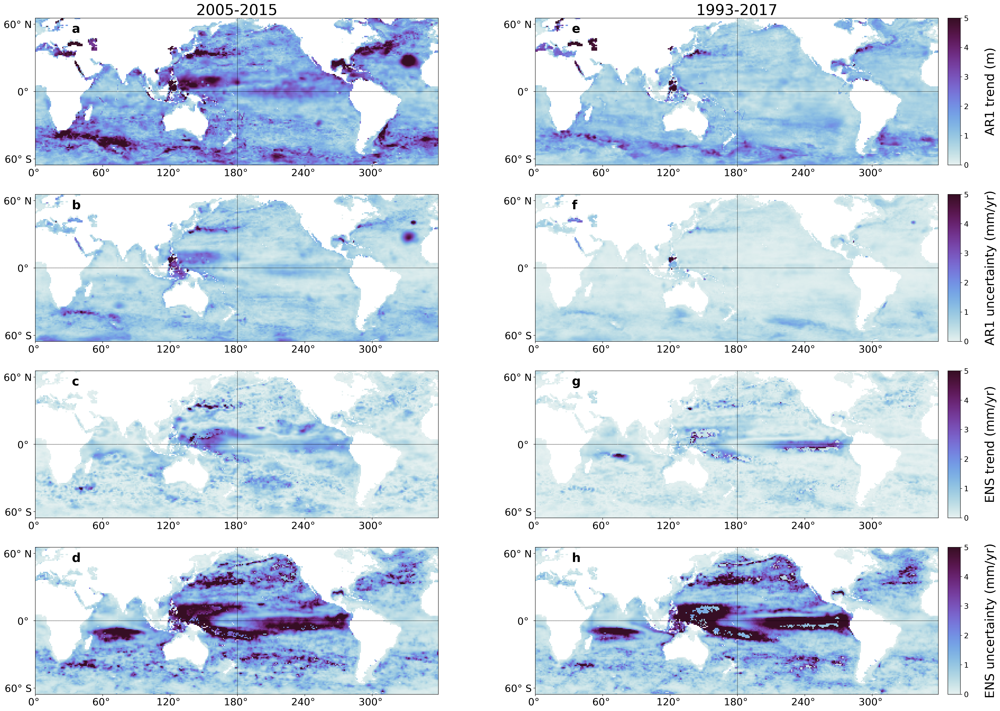

In [6]:
fig=plt.figure(figsize=(35,25),dpi=200)
gs = GridSpec(4, 6, figure=fig)

cmax=5
cmin=0
cmap=cm.cm.dense

###### 2005-2015
### Ar1 all datasets
ax1 = plt.subplot(gs.new_subplotspec((0, 0),colspan=3))
data=x[0,:,:]

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

plt.title('2005-2015',fontsize=30)

ax1.text(0.08,0.90,' a ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=20)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=20)

### unc
ax1 = plt.subplot(gs.new_subplotspec((1, 0),colspan=3))
data=x[1,:,:]

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])


ax1.text(0.08,0.90,' b ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=20)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=20)

### ENS all datasets

ax1 = plt.subplot(gs.new_subplotspec((2, 0),colspan=3))
data=x[2,:,:]

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])


ax1.text(0.08,0.90,' c ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=20)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=20)

### unc

ax1 = plt.subplot(gs.new_subplotspec((3, 0),colspan=3))
data=x[3,:,:]

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])


ax1.text(0.08,0.90,' d ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=20)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=20)

###### 1993-2017
### AR1 all datasets
ax1 = plt.subplot(gs.new_subplotspec((0, 3),colspan=3))
data=x[4,:,:]

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])

plt.title('1993-2017',fontsize=30)

ax1.text(0.08,0.90,' e ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax1.transAxes)
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax1.set_xticks(deg)
ax1.set_xticklabels(lblon,fontsize=20)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax1.set_yticks(deg)
ax1.set_yticklabels(lblat,fontsize=20)


### unc
ax2 = plt.subplot(gs.new_subplotspec((1, 3),colspan=3))
data=x[5,:,:]

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])


ax2.text(0.08,0.90,' f ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax2.transAxes)
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax2.set_xticks(deg)
ax2.set_xticklabels(lblon,fontsize=20)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax2.set_yticks(deg)
ax2.set_yticklabels(lblat,fontsize=20)
### ENS all noise models

ax3 = plt.subplot(gs.new_subplotspec((2, 3),colspan=3))
data=x[6,:,:]

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])


ax3.text(0.08,0.90,' g ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax3.transAxes)
deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax3.set_xticks(deg)
ax3.set_xticklabels(lblon,fontsize=20)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax3.set_yticks(deg)
ax3.set_yticklabels(lblat,fontsize=20)

# unc
ax4 = plt.subplot(gs.new_subplotspec((3, 3),colspan=3))
data=x[7,:,:]

m=Basemap(projection='cyl',
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), 
           llcrnrlat=lat.min(),urcrnrlat=lat.max(), 
            resolution='c')       
cax=m.pcolormesh(lon,lat,data,shading='flat',cmap=cmap)
plt.clim(cmin,cmax)
m.drawparallels([0])
m.drawmeridians([180])


ax4.text(0.08,0.90,' h ',weight='bold',fontsize=25,
        horizontalalignment='left',
        transform=ax4.transAxes)

deg=np.arange(0,360,60)
lblon=[None]*len(deg)
for i,d in enumerate(deg): lblon[i]=lon2str(d)
ax4.set_xticks(deg)
ax4.set_xticklabels(lblon,fontsize=20)

deg=np.arange(-60,61,60)
lblat=[None]*len(deg)
for i,d in enumerate(deg): lblat[i]=lat2str(d)
ax4.set_yticks(deg)
ax4.set_yticklabels(lblat,fontsize=20)

#%
cax = fig.add_axes([ax1.get_position().x1-0.02, # x position
                    ax1.get_position().y0, # y position 
                    0.01, # width
                    ax1.get_position().height]) # height
cbar=plt.colorbar( cax=cax, orientation='vertical') # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='\nAR1 trend (m)',fontsize=25)
cbar.ax.tick_params(labelsize=15)

cax = fig.add_axes([ax2.get_position().x1-0.02, # x position
                    ax2.get_position().y0, # y position 
                    0.01, # width
                    ax2.get_position().height]) # height
cbar=plt.colorbar( cax=cax, orientation='vertical') # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='\nAR1 uncertainty (mm/yr)',fontsize=25)
cbar.ax.tick_params(labelsize=15)

cax = fig.add_axes([ax3.get_position().x1-0.02, # x position
                    ax3.get_position().y0, # y position 
                    0.01, # width
                    ax3.get_position().height]) # height
cbar=plt.colorbar( cax=cax, orientation='vertical') # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='\nENS trend (mm/yr)',fontsize=25)
cbar.ax.tick_params(labelsize=15)

cax = fig.add_axes([ax4.get_position().x1-0.02, # x position
                    ax4.get_position().y0, # y position 
                    0.01, # width
                    ax4.get_position().height]) # height
cbar=plt.colorbar( cax=cax, orientation='vertical') # Similar to fig.colorbar(im, cax = cax)
cbar.set_label(label='\nENS uncertainty (mm/yr)',fontsize=25)
cbar.ax.tick_params(labelsize=15)


plt.show()


fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/pdf/SI-9_std.pdf',
            format='pdf',dpi=200,bbox_inches='tight')

fig.savefig('/Users/ccamargo/Desktop/paper1/figuresv4/png/SI-9a_std.png',
            format='png',dpi=200,bbox_inches='tight')

Figure S9

## SI Tables

1993-2017:

In [35]:

ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_1993-2017.nc')
nm=np.array(ds.nm)
j=13 # include ensemble and group means
name=np.array(ds.fnames[0:j])
aic=np.array(ds.aic[:,0:j])
bic=np.array(ds.bic[:,0:j])
aicbic=np.mean([aic,bic],axis=0)
tr=np.array(ds.trend[:,0:j])
tr_err=np.array(ds.unc[:,0:j])

bic2=np.zeros((bic.shape))
aic2=np.zeros((aic.shape))
aicbic2=np.zeros((aic.shape))
for j in np.arange(0,len(name)):
    
    tg=aic[:,j]
    logaic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logaic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logaic 
    logaic[np.isnan(logaic)]=0
    indaic=np.where(logaic>0.5)
    indaic=np.array(indaic)
    for i in np.arange(0,8):
        for ind in indaic:
            for ind2 in ind:
                if i==ind2:        
                    aic2[i,j]=1
    
    tg=bic[:,j]
    logbic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logbic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logbic 
    logbic[np.isnan(logbic)]=0
    indbic=np.where(logbic>0.5)
    indbic=np.array(indbic)
    for i in np.arange(0,8):
        for ind in indbic:
            for ind2 in ind:
                if i==ind2:        
                    bic2[i,j]=1

    #AIC|BIC
    tg=aicbic[:,j]
    logab=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logab[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logab
    logab[np.isnan(logab)]=0
    indab=np.where(logab>0.5)
    indab=np.array(indab)
    for i in np.arange(0,8):
        for ind in indab:
            for ind2 in ind:
                if i==ind2:        
                    aicbic2[i,j]=1
                    


#%%
tmp=[None]*len(name)
df2=pd.DataFrame(name,columns=['Dataset'])
lb=['aic93','bic93','aicbic93']
j=0
for data in (list([aic2,bic2,aicbic2])):
    for i in range(len(name)):  
        tg=data[:,i]
        ind=np.array(np.where(tg==1))
        ind=ind[0]
        tmp[i]=str(nm[ind])
    col=lb[j]
    df2[col]=tmp
    j=j+1

df2

,Dataset,aic93,bic93,aicbic93
0,Armor3D,['AR5' 'GGMWN'],['GGMWN'],['GGMWN']
1,CGlors,['AR5'],['AR5'],['AR5']
2,CORA,['AR9'],['AR9'],['AR9']
3,C17,['AR9'],['AR9'],['AR9']
4,EN4,['ARF' 'GGMWN'],['PL'],['PL' 'ARF' 'GGMWN']
5,FOAM,['AR9'],['ARF'],['ARF']
6,GLORYS,['AR5'],['ARF'],['AR5']
7,IK09,['AR5'],['AR5'],['AR5']
8,ORAS,['ARF'],['ARF'],['ARF']
9,SODA,['AR5'],['AR5' 'ARF'],['AR5']


2005-2015:

In [36]:
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_2005-2015.nc')
ds
j=19
nm2=np.array(ds.nm)
name=np.array(ds.fnames[0:j])
aic=np.array(ds.aic[:,0:j])
bic=np.array(ds.bic[:,0:j])
aicbic=np.mean([aic,bic],axis=0)
tr=np.array(ds.trend[:,0:j])
tr_err=np.array(ds.unc[:,0:j])

bic2=np.zeros((bic.shape))
aic2=np.zeros((aic.shape))
aicbic2=np.zeros((aic.shape))
for j in np.arange(0,len(name)):
    
    tg=aic[:,j]
    logaic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logaic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logaic 
    logaic[np.isnan(logaic)]=0
    indaic=np.where(logaic>0.5)
    indaic=np.array(indaic)
    for i in np.arange(0,8):
        for ind in indaic:
            for ind2 in ind:
                if i==ind2:        
                    aic2[i,j]=1
    
    tg=bic[:,j]
    logbic=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logbic[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logbic 
    logbic[np.isnan(logbic)]=0
    indbic=np.where(logbic>0.5)
    indbic=np.array(indbic)
    for i in np.arange(0,8):
        for ind in indbic:
            for ind2 in ind:
                if i==ind2:        
                    bic2[i,j]=1

    #AIC|BIC
    tg=aicbic[:,j]
    logab=np.zeros((tg.shape))
    for i in np.arange(0,8):
        logab[i]=np.exp((np.nanmin(tg)-tg[i])/2)
    
    logab
    logab[np.isnan(logab)]=0
    indab=np.where(logab>0.5)
    indab=np.array(indab)
    for i in np.arange(0,8):
        for ind in indab:
            for ind2 in ind:
                if i==ind2:        
                    aicbic2[i,j]=1
                    

#%%

#%%

tmp=[None]*len(name)
df3=pd.DataFrame(name,columns=['Dataset'])
lb=['aic05','bic05','aicbic05']
j=0
for data in (list([aic2,bic2,aicbic2])):
    for i in range(len(name)):  
        tg=data[:,i]
        ind=np.array(np.where(tg==1))
        ind=ind[0]
        tmp[i]=str(nm[ind])
    col=lb[j]
    df3[col]=tmp
    j=j+1
df3

,Dataset,aic05,bic05,aicbic05
0,APDRC,['AR5' 'AR9'],['AR1'],['AR1']
1,SIORG,['PL' 'AR5' 'GGMWN'],['PL'],['PL']
2,Armor3D,['AR1' 'AR5' 'ARF'],['AR1'],['AR1']
3,BOA,['AR5'],['PL'],['PL' 'AR5']
4,CGlors,['AR5'],['AR1' 'ARF'],['AR5' 'ARF']
5,CORA,['AR1' 'ARF'],['AR1'],['AR1' 'ARF']
6,C17,['AR9'],['AR9'],['AR9']
7,EN4,['AR1' 'ARF'],['AR1'],['AR1']
8,FOAM,['AR1' 'AR5'],['AR1'],['AR1']
9,GLORYS,['AR5'],['AR5'],['AR5']


Table of AR(1)- global mean trends and unc



In [37]:

# Scatter plot with AR(1)

# 2005-2015
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_2005-2015.nc')
ds
name=np.array(ds.fnames)
nm=np.array(ds.nm)
tr=np.array(ds.trend)
tr_err=np.array(ds.unc)

i=3
nm[i] # AR1
j=15
name[0:j]
######################
df=pd.DataFrame(tr[i,0:j].transpose(),columns=['AR1_tr_2005'])
df.head()
df['name']=name[0:j]
df['AR1_unc_2005']=tr_err[i,0:j].transpose()


typ=[None]*len(name[0:j])
cor=[None]*len(typ)
for k,n in enumerate(name):
    if any([n=='APDRC',n=='SIORG',n=='BOA',n=='ISAS']):
        typ[k]='Argo'
        cor[k]='red'
    if any([n=='Armor3D',n=='CORA',n=='C17',n=='EN4',n=='ISAS+',n=='IK09']):
        typ[k]='MiS'
        cor[k]='blue'
    if any([n=='CGlors',n=='FOAM',n=='ORAS',n=='GLORYS',n=='SODA']):
        typ[k]='REA'
        cor[k]='green'
    

df['typ']=typ
df['cor']=cor

df=df.set_index('name')
######################
dfmu=pd.DataFrame(tr[i,j:len(name)].transpose(),columns=['trend'])
dfmu
dfmu['Name']=name[j:len(name)]
dfmu['unc']=tr_err[i,j:len(name)].transpose()
dfmu_ar1_2005=dfmu


#%%
# 1993-2017
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/trends_global_1993-2017.nc')
ds
name2=np.array(ds.fnames)
nm=np.array(ds.nm)
tr=np.array(ds.trend)
tr_err=np.array(ds.unc)

i=3
nm[i] # AR1
j=10
name[0:j]
######################
df2=pd.DataFrame(tr[i,0:j].transpose(),columns=['AR1_tr_1993'])
df2.head()
df2['name']=name2[0:j]
df2['AR1_unc_1993']=tr_err[i,0:j].transpose()


typ=[None]*len(name2[0:j])
cor=[None]*len(typ)
for k,n in enumerate(name2):
    if any([n=='APDRC',n=='SIORG',n=='BOA',n=='ISAS']):
        typ[k]='Argo'
        cor[k]='red'
    if any([n=='Armor3D',n=='CORA',n=='C17',n=='EN4',n=='ISAS+',n=='IK09']):
        typ[k]='MiS'
        cor[k]='blue'
    if any([n=='CGlors',n=='FOAM',n=='ORAS',n=='GLORYS',n=='SODA']):
        typ[k]='REA'
        cor[k]='green'
    

df2['typ']=typ
df2['cor']=cor
df2=df2.set_index('name')
df['AR1_tr_1993']=df2['AR1_tr_1993']
df['AR1_unc_1993']=df2['AR1_unc_1993']
df=df.fillna(0)
df=df.sort_values('typ')
######################
dfmu2=pd.DataFrame(tr[i,j:len(name2)].transpose(),columns=['trend'])
dfmu2
dfmu2['Name']=name2[j:len(name2)]
dfmu2['unc']=tr_err[i,j:len(name2)].transpose()
dfmu_ar1_1993=dfmu2



In [38]:
dfmu.round(2)

,trend,Name,unc
0,0.90,ARGO,0.09
1,1.00,MiS,0.07
2,1.40,REA,0.21
3,1.08,ENS,0.07


In [39]:
dfmu2.round(2)

,trend,Name,unc
0,1.24,MiS,0.08
1,1.47,REA,0.23
2,1.36,ENS,0.10


## RMSE Analysis:

2005-2015

In [40]:
#%%
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/time_series_global_2005-2015.nc')
ds


ens=np.array(ds.glbmu[18,:])
obs=np.array(ds.glbmu[0:18,:])

rmse(ens,obs[0,:])

out=np.zeros((18))
out2=np.zeros((18))
out3=np.zeros((18))
for i in range(18):
    out[i],out2[i]=rmse(ens,obs[i,:])
    out3[i]=R_sqrd(ens,obs[i,:])
    
df=pd.DataFrame(out,columns=['RMSE'])
df['MSE']=out2
df['R2']=out3
df['dataset']=ds.fname[0:18]
print(df.round(2))

#%%
ens=np.array(ds.glbmu[18,:])
obs=np.array(ds.glbmu[0:15])
rmse(ens,obs[0,:])

out=np.zeros((15))
out2=np.zeros((15))
out3=np.zeros((15))
for i in range(15):
    out[i],out2[i]=rmse(ens,obs[i,:])
    out3[i]=R_sqrd(ens,obs[i,:])
    
df=pd.DataFrame(out,columns=['RMSE'])
df['MSE']=out2
df['R2']=out3
df['dataset']=ds.fname[0:15]

    RMSE  MSE    R2  dataset
0   0.00  0.0  0.81    APDRC
1   0.00  0.0  0.84    SIORG
2   0.00  0.0  0.76  Armor3D
3   0.00  0.0  0.68      BOA
4   0.00  0.0  0.95   CGlors
5   0.00  0.0  0.93     CORA
6   0.00  0.0  0.90      C17
7   0.00  0.0  0.90      EN4
8   0.01  0.0  0.52     FOAM
9   0.00  0.0  0.76   GLORYS
10  0.00  0.0  0.93     ISAS
11  0.00  0.0  0.93    ISAS+
12  0.00  0.0  0.93     IK09
13  0.00  0.0  0.86     ORAS
14  0.00  0.0  0.83     SODA
15  0.00  0.0  0.91     ARGO
16  0.00  0.0  0.98      MiS
17  0.00  0.0  0.93      REA


In [41]:
cutoff=0.7
#%%
print('Considering the ENS(15) as the reference, the smallest RMSE dataset is '+
      str(np.array(ds.fname[np.where(out==np.min(out))] ) ) +
     'and with the lowest MSE is '+
     str(np.array(ds.fname[np.where(out2==np.min(out2))] ) ) +
     '. The dataset with the highest R-squared is: '+ 
     str(np.array(ds.fname[np.where(out3==np.max(out3))] ) ) +
     '. The following datasets have a R-squared <' + str(cutoff) +': '+
     str(np.array(ds.fname[np.where(out3<cutoff)] ) ))

ds.fname[np.where(out2==np.min(out2))]
ds.fname[np.where(out3<cutoff)]
ds.fname[(np.where(out3==np.max(out3)))]    

#%%
# Argo group
j=4 # number of individual datasets
k=132 # length of time series
ens=np.array(ds.glbmu[15,:])
obs=np.zeros((j,k))
ind=[0,1,3,10]
name=ds.fname[ind]
for ii,i in enumerate(ind): obs[ii,:]=np.array(ds.glbmu[i,:])
out=np.zeros((j));out2=np.zeros((j));out3=np.zeros((j))
for i in range(j):
    out[i],out2[i]=rmse(ens,obs[i,:])
    out3[i]=R_sqrd(ens,obs[i,:])
    
df=pd.DataFrame(out,columns=['RMSE'])
df['MSE']=out2
df['R2']=out3
df['dataset']=ds.fname[ind]
df
#%%

#%%
print('Considering the Argo-group mean as the reference for the individual dataets of the group, the smallest RMSE dataset is '+
      str(np.array(name[np.where(out==np.min(out))] ) ) +
     'and with the lowest MSE is '+
     str(np.array(name[np.where(out2==np.min(out2))] ) ) +
     '. The dataset with the highest R-squared is: '+ 
     str(np.array(name[np.where(out3==np.max(out3))] ) ) +
     '. The following datasets have a R-squared <' + str(cutoff) +': '+
     str(np.array(name[np.where(out3<cutoff)] ) ))


#%%
# MiS group
j=6 # number of individual datasets
k=132 # length of time series
ens=np.array(ds.glbmu[15,:])
obs=np.zeros((j,k))
ind=[2,5,6,7,11,12]
name=ds.fname[ind]
for ii,i in enumerate(ind): obs[ii,:]=np.array(ds.glbmu[i,:])
out=np.zeros((j));out2=np.zeros((j));out3=np.zeros((j))
for i in range(j):
    out[i],out2[i]=rmse(ens,obs[i,:])
    out3[i]=R_sqrd(ens,obs[i,:])
    
df=pd.DataFrame(out,columns=['RMSE'])
df['MSE']=out2
df['R2']=out3
df['dataset']=ds.fname[ind]
df
#%%
print('Considering the MiS-group mean as the reference for the individual dataets of the group, the smallest RMSE dataset is '+
      str(np.array(name[np.where(out==np.min(out))] ) ) +
     'and with the lowest MSE is '+
     str(np.array(name[np.where(out2==np.min(out2))] ) ) +
     '. The dataset with the highest R-squared is: '+ 
     str(np.array(name[np.where(out3==np.max(out3))] ) ) +
     '. The following datasets have a R-squared <' + str(cutoff) +': '+
     str(np.array(name[np.where(out3<cutoff)] ) ))

 
#%%
# REA group
j=5 # number of individual datasets
k=132 # length of time series
ens=np.array(ds.glbmu[15,:])
obs=np.zeros((j,k))
ind=[4,8,9,13,14]
name=ds.fname[ind]
for ii,i in enumerate(ind): obs[ii,:]=np.array(ds.glbmu[i,:])
out=np.zeros((j));out2=np.zeros((j));out3=np.zeros((j))
for i in range(j):
    out[i],out2[i]=rmse(ens,obs[i,:])
    out3[i]=R_sqrd(ens,obs[i,:])
    
df=pd.DataFrame(out,columns=['RMSE'])
df['MSE']=out2
df['R2']=out3
df['dataset']=ds.fname[ind]
df
#%%
print('Considering the REA-group mean as the reference for the individual dataets of the group, the smallest RMSE dataset is '+
      str(np.array(name[np.where(out==np.min(out))] ) ) +
     'and with the lowest MSE is '+
     str(np.array(name[np.where(out2==np.min(out2))] ) ) +
     '. The dataset with the highest R-squared is: '+ 
     str(np.array(name[np.where(out3==np.max(out3))] ) ) +
     '. The following datasets have a R-squared <' + str(cutoff) +': '+
     str(np.array(name[np.where(out3<cutoff)] ) ))





Considering the ENS(15) as the reference, the smallest RMSE dataset is ['ISAS+']and with the lowest MSE is ['ISAS+']. The dataset with the highest R-squared is: ['CGlors']. The following datasets have a R-squared <0.7: ['BOA' 'FOAM']
Considering the Argo-group mean as the reference for the individual dataets of the group, the smallest RMSE dataset is ['ISAS']and with the lowest MSE is ['ISAS']. The dataset with the highest R-squared is: ['ISAS']. The following datasets have a R-squared <0.7: []
Considering the MiS-group mean as the reference for the individual dataets of the group, the smallest RMSE dataset is ['ISAS+']and with the lowest MSE is ['ISAS+']. The dataset with the highest R-squared is: ['ISAS+']. The following datasets have a R-squared <0.7: []
Considering the REA-group mean as the reference for the individual dataets of the group, the smallest RMSE dataset is ['CGlors']and with the lowest MSE is ['CGlors']. The dataset with the highest R-squared is: ['CGlors']. The follow

1993-2017:

In [42]:

#%% 1993-2017
ds=xr.open_dataset('~/Desktop/paper1/steric/data/pub/time_series_global_1993-2017.nc')
ds


ens=np.array(ds.glbmu[12,:])
obs=np.array(ds.glbmu[0:12,:])

rmse(ens,obs[0,:])

out=np.zeros((12))
out2=np.zeros((12))
out3=np.zeros((12))
for i in range(12):
    out[i],out2[i]=rmse(ens,obs[i,:])
    out3[i]=R_sqrd(ens,obs[i,:])
    
df=pd.DataFrame(out,columns=['RMSE'])
df['MSE']=out2
df['R2']=out3
df['dataset']=ds.fname[0:12]
print(df.round(2))


ens=np.array(ds.glbmu[12,:])
obs=np.array(ds.glbmu[0:10,:])


out=np.zeros((10))
out2=np.zeros((10))
out3=np.zeros((10))
for i in range(10):
    out[i],out2[i]=rmse(ens,obs[i,:])
    out3[i]=R_sqrd(ens,obs[i,:])
    
df=pd.DataFrame(out,columns=['RMSE'])
df['MSE']=out2
df['R2']=out3
df['dataset']=ds.fname[0:10]

#%%


    RMSE  MSE    R2  dataset
0   0.01  0.0  0.84  Armor3D
1   0.00  0.0  0.96   CGlors
2   0.00  0.0  0.75     CORA
3   0.00  0.0  0.85      C17
4   0.00  0.0  0.93      EN4
5   0.01  0.0  0.37     FOAM
6   0.01  0.0  0.85   GLORYS
7   0.00  0.0  0.67     IK09
8   0.01  0.0  0.81     ORAS
9   0.00  0.0  0.90     SODA
10  0.00  0.0  0.89      MiS
11  0.00  0.0  0.94      REA


In [43]:
print('Considering the ENS(10) as the reference, the smallest RMSE dataset is '+
      str(np.array(ds.fname[np.where(out==np.min(out))] ) ) +
     'and with the lowest MSE is '+
     str(np.array(ds.fname[np.where(out2==np.min(out2))] ) ) +
     '. The dataset with the highest R-squared is: '+ 
     str(np.array(ds.fname[np.where(out3==np.max(out3))] ) ) +
     '. The following datasets have a R-squared <' + str(cutoff) +': '+
     str(np.array(ds.fname[np.where(out3<cutoff)] ) ))   

#%%
ds.fname
#%%
# MiS group
j=5 # number of individual datasets
k=300 # length of time series
ens=np.array(ds.glbmu[10,:])
obs=np.zeros((j,k))
ind=[0,2,3,4,7]
name=ds.fname[ind]
for ii,i in enumerate(ind): obs[ii,:]=np.array(ds.glbmu[i,:])
out=np.zeros((j));out2=np.zeros((j));out3=np.zeros((j))
for i in range(j):
    out[i],out2[i]=rmse(ens,obs[i,:])
    out3[i]=R_sqrd(ens,obs[i,:])
    
df=pd.DataFrame(out,columns=['RMSE'])
df['MSE']=out2
df['R2']=out3
df['dataset']=ds.fname[ind]
df
#%%
print('Considering the MiS-group mean as the reference for the individual dataets of the group, the smallest RMSE dataset is '+
      str(np.array(name[np.where(out==np.min(out))] ) ) +
     'and with the lowest MSE is '+
     str(np.array(name[np.where(out2==np.min(out2))] ) ) +
     '. The dataset with the highest R-squared is: '+ 
     str(np.array(name[np.where(out3==np.max(out3))] ) ) +
     '. The following datasets have a R-squared <' + str(cutoff) +': '+
     str(np.array(name[np.where(out3<cutoff)] ) ))


#%%
# REA group
j=5 # number of individual datasets
k=300 # length of time series
ens=np.array(ds.glbmu[11,:])
obs=np.zeros((j,k))
ind=[1,5,6,8,9]
name=ds.fname[ind]
for ii,i in enumerate(ind): obs[ii,:]=np.array(ds.glbmu[i,:])
out=np.zeros((j));out2=np.zeros((j));out3=np.zeros((j))
for i in range(j):
    out[i],out2[i]=rmse(ens,obs[i,:])
    out3[i]=R_sqrd(ens,obs[i,:])
    
df=pd.DataFrame(out,columns=['RMSE'])
df['MSE']=out2
df['R2']=out3
df['dataset']=ds.fname[ind]
df
#%%
print('Considering the REA-group mean as the reference for the individual dataets of the group, the smallest RMSE dataset is '+
      str(np.array(name[np.where(out==np.min(out))] ) ) +
     'and with the lowest MSE is '+
     str(np.array(name[np.where(out2==np.min(out2))] ) ) +
     '. The dataset with the highest R-squared is: '+ 
     str(np.array(name[np.where(out3==np.max(out3))] ) ) +
     '. The following datasets have a R-squared <' + str(cutoff) +': '+
     str(np.array(name[np.where(out3<cutoff)] ) ))

Considering the ENS(10) as the reference, the smallest RMSE dataset is ['CGlors']and with the lowest MSE is ['CGlors']. The dataset with the highest R-squared is: ['CGlors']. The following datasets have a R-squared <0.7: ['FOAM' 'IK09']
Considering the MiS-group mean as the reference for the individual dataets of the group, the smallest RMSE dataset is ['CORA']and with the lowest MSE is ['CORA']. The dataset with the highest R-squared is: ['CORA']. The following datasets have a R-squared <0.7: []
Considering the REA-group mean as the reference for the individual dataets of the group, the smallest RMSE dataset is ['CGlors']and with the lowest MSE is ['CGlors']. The dataset with the highest R-squared is: ['CGlors']. The following datasets have a R-squared <0.7: ['FOAM']
